# Avance 3 Equipo 20 – Análisis Exploratorio de Datos (EDA) e Ingeniería de Características, Baseline

## Proyecto: Detección y Clasificación de Anillos en Galaxias  
**Materia:** Proyecto Integrador (Tec de Monterrey / UNAM)  
**Equipo:** Equipo 20  
**Fecha:** 15 Febrero 2026

---

### Propósito (CRISP-ML: Comprensión y Preparación de los datos)
Este notebook presenta:
1. **Análisis Exploratorio de Datos (EDA)**: Comprensión profunda del dataset de galaxias
2. **Feature Engineering**: Ingeniería de características para mejorar el rendimiento de modelos ML
3. **Baseline**:Este avance consiste en construir un modelo de referencia que permita evaluar la viabilidad del problema. Si el baseline tiene un rendimiento similar al azar, podría indicar que el problema es intrínsecamente difícil o que los datos no contienen suficiente información para predecir el objetivo. De lo contrario, el baseline podría como una solución mínima aceptable cuando se trabaja en escenarios donde incluso un modelo simple puede proporcionar valor.


**Objetivos:**
- Comprender la distribución y características del dataset
- Identificar patrones, outliers y relaciones entre variables
- Crear nuevas características para mejorar el rendimiento de futuros modelos
- Mitigar riesgo de características sesgadas y acelerar convergencia
- ¿Qué algoritmo se puede utilizar como baseline para predecir las variables objetivo? 
- ¿Se puede determinar la importancia de las características para el modelo generado? Recuerden que incluir características irrelevantes puede afectar negativamente el rendimiento del modelo y aumentar la complejidad sin beneficios sustanciales.
- ¿El modelo está sub/sobreajustando los datos de entrenamiento?
- ¿Cuál es la métrica adecuada para este problema de negocio? 
- ¿Cuál debería ser el desempeño mínimo a obtener?


---
# PARTE 1: ANÁLISIS EXPLORATORIO DE DATOS (EDA)
---

## 1. Importación de Librerías

In [1]:
import os
import urllib.request
# Manipulación de datos
import pandas as pd
import numpy as np

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Análisis estadístico
from scipy import stats
from scipy.stats import normaltest, shapiro, anderson

# Machine Learning (para análisis avanzado)
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Astropy para procesamiento de imágenes FITS
from astropy.io import fits
from astropy.visualization import ZScaleInterval

# Configuración
import warnings
warnings.filterwarnings('ignore')

# Configuración de visualización
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 10



print("Librerías importadas correctamente")



Librerías importadas correctamente


## 2. Carga del Dataset

In [2]:
# Cargar el dataset
df = pd.read_csv('../Dataset/dataset.csv')  # Ajusta la ruta según tu estructura

print("Dataset cargado correctamente")
print(f"\n Dimensiones: {df.shape[0]:,} filas × {df.shape[1]} columnas")

Dataset cargado correctamente

 Dimensiones: 8,528 filas × 5 columnas


## 3. Exploración Inicial

In [3]:
# Información general
print("="*80)
print("INFORMACIÓN GENERAL DEL DATASET")
print("="*80)
df.info()

INFORMACIÓN GENERAL DEL DATASET
<class 'pandas.DataFrame'>
RangeIndex: 8528 entries, 0 to 8527
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   objID    8528 non-null   int64  
 1   ra       8528 non-null   float64
 2   dec      8528 non-null   float64
 3   z        8528 non-null   float64
 4   anillos  8528 non-null   float64
dtypes: float64(4), int64(1)
memory usage: 333.3 KB


In [4]:
# Primeras filas
print("\n PRIMERAS 10 FILAS:")
df.head(10)


 PRIMERAS 10 FILAS:


,objID,ra,dec,z,anillos
0,1237648721210769659,134.447170,-0.199973,0.028206,0.0
1,1237648705657307354,198.233560,0.941188,0.048037,0.0
2,1237648705120895059,199.294920,0.527571,0.024114,0.0
3,1237648720150724863,165.740610,-0.962095,0.033483,0.0
4,1237649919509594232,31.372020,13.251016,0.024694,0.0
5,1237649919508742339,29.482672,13.358159,0.044325,0.0
6,1237648702973542469,199.541950,-1.243647,0.019151,0.0
7,1237648703503794332,184.470380,-0.657224,0.029612,0.0
8,1237648721754587278,150.299480,0.329321,0.034489,0.0
9,1237648721754718358,150.628460,0.307289,0.033677,0.0


In [5]:
# Tipos de columnas
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

print("="*80)
print("TIPOS DE VARIABLES")
print("="*80)
print(f"\n Variables Numéricas ({len(numeric_cols)}):")
for i, col in enumerate(numeric_cols, 1):
    print(f"   {i}. {col}")

print(f"\n Variables Categóricas ({len(categorical_cols)}):")
for i, col in enumerate(categorical_cols, 1):
    print(f"   {i}. {col}")

TIPOS DE VARIABLES

 Variables Numéricas (5):
   1. objID
   2. ra
   3. dec
   4. z
   5. anillos

 Variables Categóricas (0):


## 4. Estadísticas Descriptivas

In [6]:
# Estadísticas básicas
print("ESTADÍSTICAS DESCRIPTIVAS - VARIABLES NUMÉRICAS")
print("="*80)
df[numeric_cols].describe().T.style.background_gradient(cmap='Blues')

ESTADÍSTICAS DESCRIPTIVAS - VARIABLES NUMÉRICAS


,count,mean,std,min,25%,50%,75%,max
objID,8528.000000,1237661882417030400.000000,5887858785012.494141,1237648672921485568.000000,1237657772188909824.000000,1237662236942860544.000000,1237665566081171712.000000,1237680472834048000.000000
ra,8528.000000,183.268013,59.249332,0.008759,153.145473,185.068475,219.528357,359.276680
dec,8528.000000,25.180086,18.394527,-11.082615,10.446179,23.905970,39.203309,70.133229
z,8528.000000,0.035896,0.015032,0.010068,0.024653,0.033006,0.044839,0.098892
anillos,8528.000000,1.767589,4.059707,0.000000,0.000000,0.000000,0.000000,16.000000


In [7]:
# Estadísticas extendidas
stats_df = pd.DataFrame({
    'Media': df[numeric_cols].mean(),
    'Mediana': df[numeric_cols].median(),
    'Desv. Estándar': df[numeric_cols].std(),
    'Min': df[numeric_cols].min(),
    'Max': df[numeric_cols].max(),
    'Rango': df[numeric_cols].max() - df[numeric_cols].min(),
    'Asimetría': df[numeric_cols].skew(),
    'Curtosis': df[numeric_cols].kurtosis(),
    'Coef. Variación (%)': (df[numeric_cols].std() / df[numeric_cols].mean() * 100).round(2)
})

print("\nESTADÍSTICAS EXTENDIDAS:")
stats_df.style.background_gradient(cmap='viridis')


ESTADÍSTICAS EXTENDIDAS:


,Media,Mediana,Desv. Estándar,Min,Max,Rango,Asimetría,Curtosis,Coef. Variación (%)
objID,1237661882417030400.000000,1237662236942860288.000000,5887858785012.494141,1237648672921485568.000000,1237680472834048000.000000,31799912562432.000000,-0.105808,-0.137403,0.000000
ra,183.268013,185.068475,59.249332,0.008759,359.276680,359.267921,-0.381811,1.773294,32.330000
dec,25.180086,23.905970,18.394527,-11.082615,70.133229,81.215844,0.221539,-0.846490,73.050000
z,0.035896,0.033006,0.015032,0.010068,0.098892,0.088824,0.807391,0.362089,41.880000
anillos,1.767589,0.000000,4.059707,0.000000,16.000000,16.000000,2.458444,4.982156,229.670000


### 4.1 Análisis de Variables Categóricas

In [8]:
if categorical_cols:
    print("ANÁLISIS DE VARIABLES CATEGÓRICAS")
    print("="*80)
    
    for col in categorical_cols:
        print(f"\n📌 Variable: {col}")
        print("-"*80)
        print(f"   Valores únicos: {df[col].nunique()}")
        
        value_counts = df[col].value_counts()
        print(f"\n   Distribución de frecuencias:")
        
        if df[col].nunique() <= 20:
            for value, count in value_counts.items():
                percent = 100 * count / len(df)
                bar = '█' * int(percent / 2)
                print(f"   {str(value):30s}: {count:6,} ({percent:5.2f}%) {bar}")
        else:
            print(f"   (Mostrando top 15 de {df[col].nunique()} categorías)")
            for value, count in value_counts.head(15).items():
                percent = 100 * count / len(df)
                bar = '█' * int(percent / 2)
                print(f"   {str(value):30s}: {count:6,} ({percent:5.2f}%) {bar}")
else: 
     print("No hay variables categóricas en el dataset.")

No hay variables categóricas en el dataset.


## 5. Calidad de Datos

### 5.1 Valores Faltantes

In [9]:
# Análisis de valores faltantes
missing_counts = df.isnull().sum()
missing_percent = 100 * missing_counts / len(df)

missing_df = pd.DataFrame({
    'Columna': df.columns,
    'Valores Faltantes': missing_counts.values,
    'Porcentaje (%)': missing_percent.values
})

missing_df = missing_df[missing_df['Valores Faltantes'] > 0].sort_values(
    'Valores Faltantes', ascending=False)

print("="*80)
print("ANÁLISIS DE VALORES FALTANTES")
print("="*80)

if len(missing_df) > 0:
    print(f"\n  Se encontraron valores faltantes en {len(missing_df)} columna(s):\n")
    display(missing_df.style.background_gradient(cmap='Reds'))
else:
    print("\n ¡Excelente! No hay valores faltantes en el dataset.")

print(f"\nTotal de valores faltantes: {df.isnull().sum().sum():,}")
print(f"Porcentaje total: {100 * df.isnull().sum().sum() / (df.shape[0] * df.shape[1]):.2f}%")

ANÁLISIS DE VALORES FALTANTES

 ¡Excelente! No hay valores faltantes en el dataset.

Total de valores faltantes: 0
Porcentaje total: 0.00%


In [10]:
# Visualización de valores faltantes
if len(missing_df) > 0:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Gráfico de barras
    missing_df.plot(x='Columna', y='Valores Faltantes', kind='barh', ax=ax1, color='salmon')
    ax1.set_title('Valores Faltantes por Columna', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Cantidad de Valores Faltantes')
    
    # Heatmap
    sns.heatmap(df.isnull(), cbar=True, yticklabels=False, cmap='RdYlGn_r', ax=ax2)
    ax2.set_title('Mapa de Valores Faltantes', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
else:
    print("No hay valores faltantes que mostrar")

No hay valores faltantes que mostrar


### 5.2 Duplicados

In [11]:
# Análisis de duplicados
duplicates = df.duplicated().sum()

print("="*80)
print("ANÁLISIS DE FILAS DUPLICADAS")
print("="*80)
print(f"\nFilas duplicadas: {duplicates:,}")
print(f"Porcentaje de duplicados: {100 * duplicates / len(df):.2f}%")

if duplicates > 0:
    print(f"\n  Se encontraron {duplicates} filas duplicadas.")
    print("\nEjemplo de filas duplicadas:")
    display(df[df.duplicated(keep=False)].head(10))
else:
    print("\n No hay filas duplicadas en el dataset.")

ANÁLISIS DE FILAS DUPLICADAS

Filas duplicadas: 0
Porcentaje de duplicados: 0.00%

 No hay filas duplicadas en el dataset.


## 6. Análisis de Distribuciones

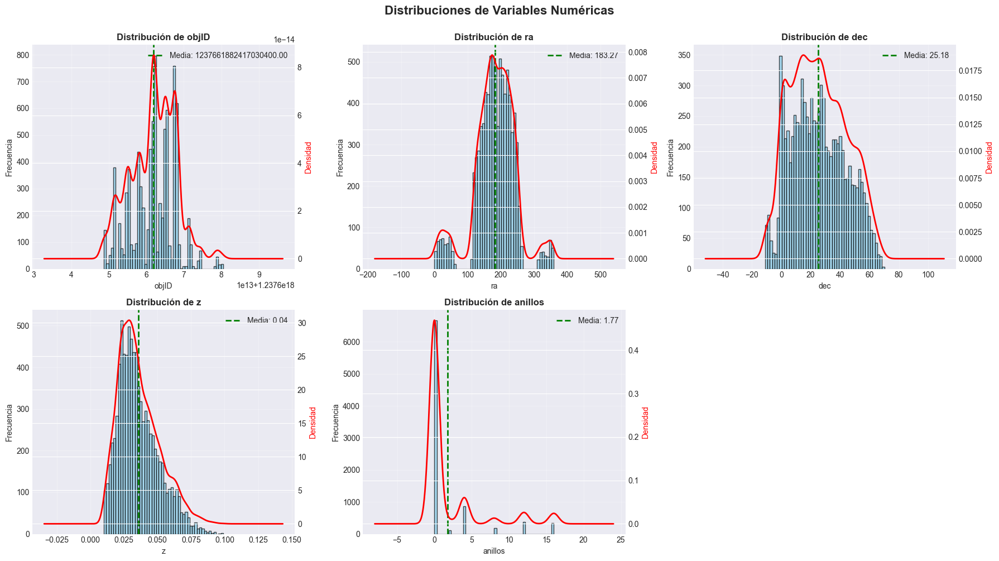

In [12]:
# Histogramas para todas las variables numéricas
if numeric_cols:
    n_cols = 3
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
    axes = axes.flatten()
    
    for idx, col in enumerate(numeric_cols):
        ax = axes[idx]
        
        # Histograma con KDE
        ax.hist(df[col].dropna(), bins=50, alpha=0.7, color='skyblue', edgecolor='black')
        ax2 = ax.twinx()
        df[col].dropna().plot(kind='kde', ax=ax2, color='red', linewidth=2)
        
        ax.set_title(f'Distribución de {col}', fontsize=12, fontweight='bold')
        ax.set_xlabel(col)
        ax.set_ylabel('Frecuencia')
        ax2.set_ylabel('Densidad', color='red')
        ax.grid(True, alpha=0.3)
        
        # Línea de media
        mean_val = df[col].mean()
        ax.axvline(mean_val, color='green', linestyle='--', linewidth=2, label=f'Media: {mean_val:.2f}')
        ax.legend()
    
    # Ocultar ejes sobrantes
    for idx in range(len(numeric_cols), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle('Distribuciones de Variables Numéricas', fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()

## 7. Análisis de Outliers

In [13]:
# Detección de outliers usando el método IQR
if numeric_cols:
    outlier_summary = []
    
    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers_mask = (df[col] < lower_bound) | (df[col] > upper_bound)
        outliers = df[outliers_mask]
        
        outlier_summary.append({
            'Variable': col,
            'Q1': round(Q1, 3),
            'Q3': round(Q3, 3),
            'IQR': round(IQR, 3),
            'Límite Inferior': round(lower_bound, 3),
            'Límite Superior': round(upper_bound, 3),
            'Outliers': len(outliers),
            'Porcentaje (%)': round(100 * len(outliers) / len(df), 2)
        })
    
    outlier_df = pd.DataFrame(outlier_summary)
    
    print("="*100)
    print("DETECCIÓN DE OUTLIERS - MÉTODO IQR")
    print("="*100)
    print("\nOutliers = valores fuera del rango [Q1 - 1.5*IQR, Q3 + 1.5*IQR]\n")
    
    display(outlier_df.style.background_gradient(subset=['Outliers'], cmap='Oranges'))

DETECCIÓN DE OUTLIERS - MÉTODO IQR

Outliers = valores fuera del rango [Q1 - 1.5*IQR, Q3 + 1.5*IQR]



,Variable,Q1,Q3,IQR,Límite Inferior,Límite Superior,Outliers,Porcentaje (%)
0,objID,1237657772188909824.000000,1237665566081171712.000000,7793892261888.000000,1237646081350516992.000000,1237677256919564544.000000,87,1.020000
1,ra,153.145000,219.528000,66.383000,53.571000,319.103000,727,8.520000
2,dec,10.446000,39.203000,28.757000,-32.690000,82.339000,0,0.000000
3,z,0.025000,0.045000,0.020000,-0.006000,0.075000,120,1.410000
4,anillos,0.000000,0.000000,0.000000,0.000000,0.000000,1868,21.900000


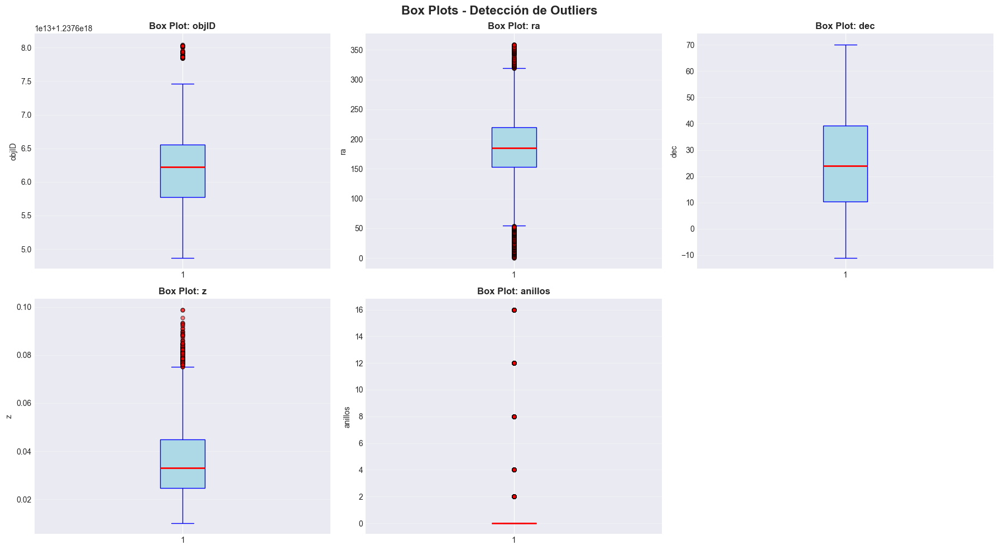

In [14]:
# Box plots para visualizar outliers
if numeric_cols:
    n_cols = 3
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
    axes = axes.flatten()
    
    for idx, col in enumerate(numeric_cols):
        ax = axes[idx]
        
        # Box plot
        bp = ax.boxplot(df[col].dropna(), vert=True, patch_artist=True,
                        boxprops=dict(facecolor='lightblue', color='blue'),
                        whiskerprops=dict(color='blue'),
                        capprops=dict(color='blue'),
                        medianprops=dict(color='red', linewidth=2),
                        flierprops=dict(marker='o', markerfacecolor='red', markersize=5, alpha=0.5))
        
        ax.set_title(f'Box Plot: {col}', fontsize=12, fontweight='bold')
        ax.set_ylabel(col)
        ax.grid(True, alpha=0.3, axis='y')
    
    # Ocultar ejes sobrantes
    for idx in range(len(numeric_cols), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle('Box Plots - Detección de Outliers', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

## 8. Análisis de Correlaciones

MATRIZ DE CORRELACIÓN (Pearson)


,objID,ra,dec,z,anillos
objID,1.000000,-0.014308,-0.085891,-0.049101,-0.021027
ra,-0.014308,1.000000,0.084268,0.046654,-0.079916
dec,-0.085891,0.084268,1.000000,0.024105,0.018132
z,-0.049101,0.046654,0.024105,1.000000,0.049988
anillos,-0.021027,-0.079916,0.018132,0.049988,1.000000


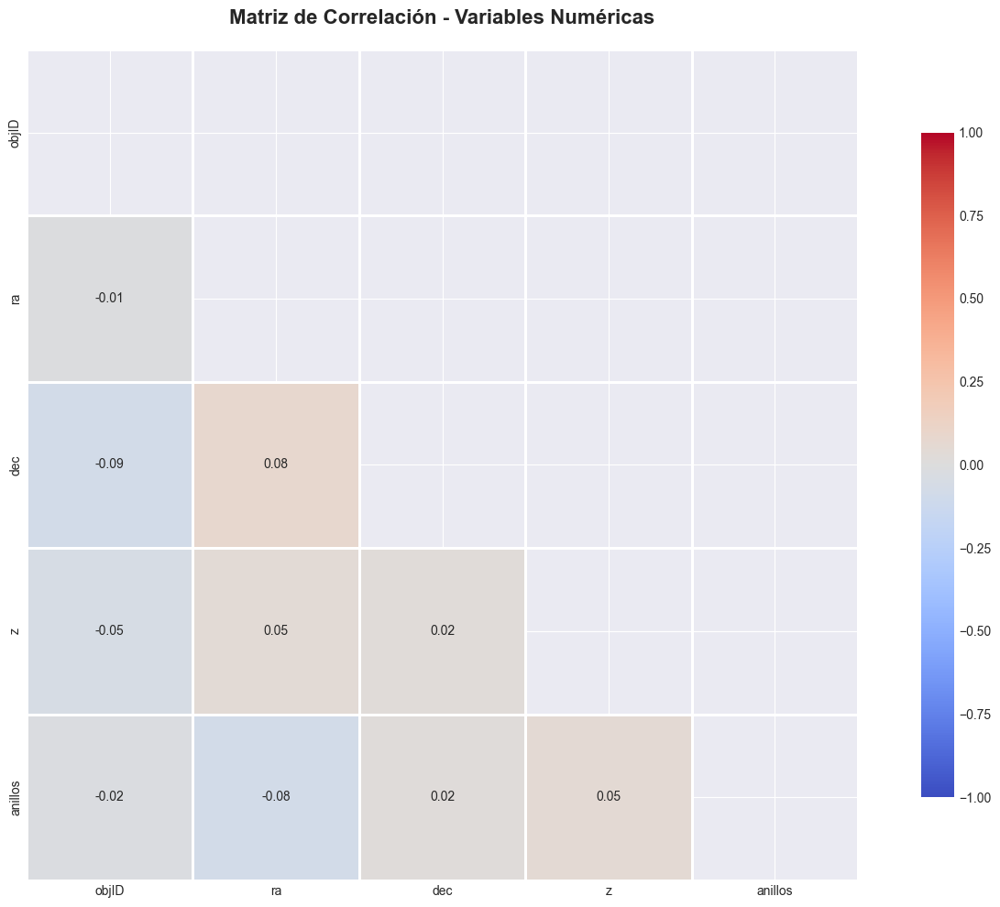

In [15]:
# Matriz de correlación
if len(numeric_cols) > 1:
    corr_matrix = df[numeric_cols].corr()
    
    print("="*80)
    print("MATRIZ DE CORRELACIÓN (Pearson)")
    print("="*80)
    display(corr_matrix.style.background_gradient(cmap='coolwarm', vmin=-1, vmax=1))
    
    # Heatmap
    plt.figure(figsize=(14, 10))
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', cmap='coolwarm', 
                center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8},
                vmin=-1, vmax=1)
    plt.title('Matriz de Correlación - Variables Numéricas', fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()

In [16]:
# Correlaciones fuertes
if len(numeric_cols) > 1:
    print("="*80)
    print("CORRELACIONES FUERTES (|r| > 0.7)")
    print("="*80)
    
    high_corr = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            corr_val = corr_matrix.iloc[i, j]
            if abs(corr_val) > 0.7:
                high_corr.append({
                    'Variable 1': corr_matrix.columns[i],
                    'Variable 2': corr_matrix.columns[j],
                    'Correlación': round(corr_val, 4),
                    'Tipo': 'Positiva fuerte' if corr_val > 0 else 'Negativa fuerte'
                })
    
    if high_corr:
        high_corr_df = pd.DataFrame(high_corr).sort_values('Correlación', key=abs, ascending=False)
        display(high_corr_df.style.background_gradient(subset=['Correlación'], cmap='RdYlGn', vmin=-1, vmax=1))
    else:
        print("\n✓ No se encontraron correlaciones fuertes (|r| > 0.7) entre variables.")

CORRELACIONES FUERTES (|r| > 0.7)

✓ No se encontraron correlaciones fuertes (|r| > 0.7) entre variables.


### Scatter Matrix (Pairplot)

Generando Scatter Matrix (esto puede tomar un momento)...


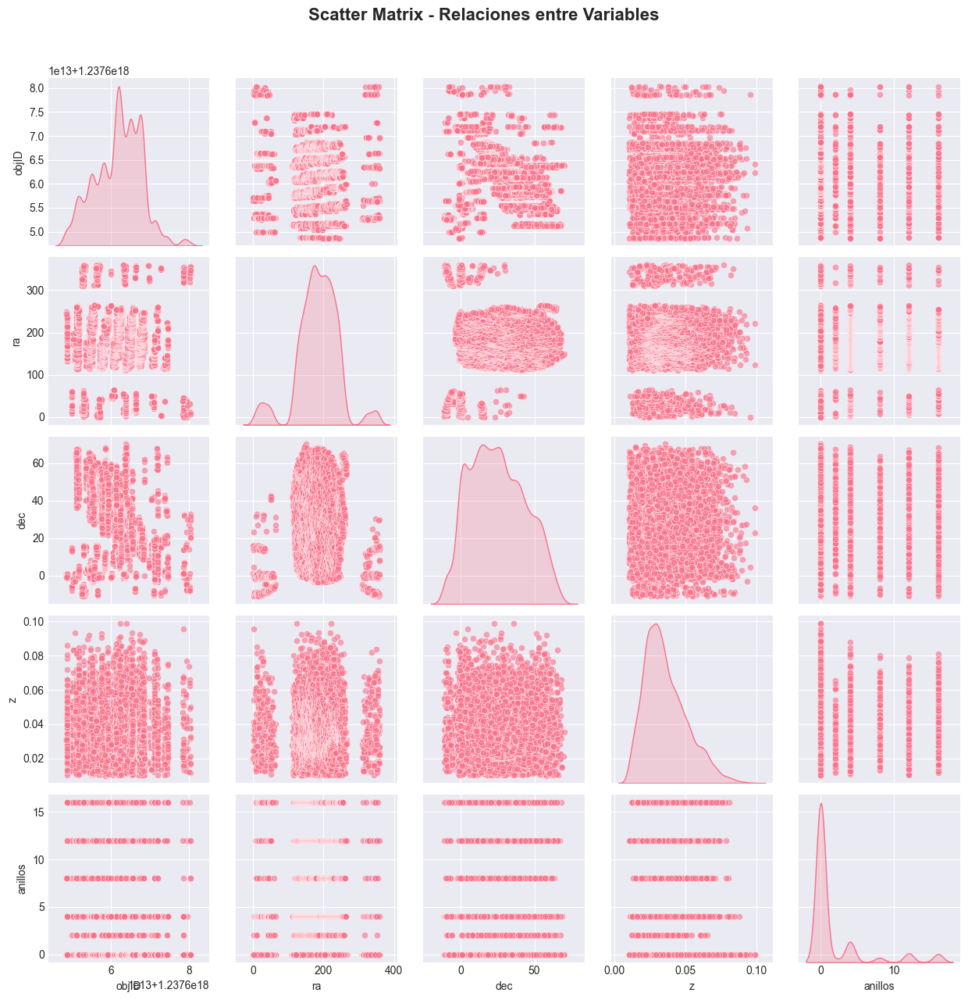

In [17]:
# Pairplot para visualizar relaciones
if len(numeric_cols) > 1 and len(numeric_cols) <= 10:
    print("Generando Scatter Matrix (esto puede tomar un momento)...")
    
    # Si hay una variable categórica, usarla como hue
    hue_col = categorical_cols[0] if categorical_cols and df[categorical_cols[0]].nunique() <= 10 else None
    
    if hue_col:
        sns.pairplot(df[numeric_cols + [hue_col]], hue=hue_col, diag_kind='kde', 
                     plot_kws={'alpha': 0.6}, height=2.5)
    else:
        sns.pairplot(df[numeric_cols], diag_kind='kde', plot_kws={'alpha': 0.6}, height=2.5)
    
    plt.suptitle('Scatter Matrix - Relaciones entre Variables', y=1.02, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
elif len(numeric_cols) > 10:
    print(f"  Hay {len(numeric_cols)} variables numéricas. Se omite el pairplot para evitar sobrecarga visual.")
    print("Sugerencia: Selecciona un subconjunto de variables importantes para el pairplot.")
else:
    print("Se necesitan al menos 2 variables numéricas para el scatter matrix.")

## 9. Visualizaciones para Variables Categóricas

In [18]:
# Gráficos para variables categóricas
if categorical_cols:
    for col in categorical_cols:
        if df[col].nunique() <= 20:
            value_counts = df[col].value_counts()
            
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
            
            # Gráfico de barras
            value_counts.plot(kind='barh', ax=ax1, color='steelblue', edgecolor='black')
            ax1.set_title(f'Frecuencia de {col}', fontsize=14, fontweight='bold')
            ax1.set_xlabel('Frecuencia')
            ax1.set_ylabel(col)
            ax1.grid(True, alpha=0.3, axis='x')
            
            # Añadir valores en las barras
            for i, (idx, val) in enumerate(value_counts.items()):
                ax1.text(val, i, f' {val:,}', va='center', fontsize=10)
            
            # Gráfico de pastel
            colors = plt.cm.Set3(range(len(value_counts)))
            wedges, texts, autotexts = ax2.pie(value_counts, labels=value_counts.index, 
                                                autopct='%1.1f%%', colors=colors,
                                                startangle=90, textprops={'fontsize': 10})
            ax2.set_title(f'Distribución Porcentual de {col}', fontsize=14, fontweight='bold')
            
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_fontweight('bold')
            
            plt.tight_layout()
            plt.show()
else:
    print("No hay variables categoricas para mostrar")

No hay variables categoricas para mostrar


In [19]:
# Catálogo del Avance 1 (código -> interpretación física)
ANILLOS_MAP = {
    0:  "Sin anillo",
    2:  "Anillo nuclear",
    4:  "Anillo interno",
    8:  "Anillo externo",
    12: "Anillo interno + externo",
    16: "Anillos parciales / pseudoanillos"
}

# Asegurar consistencia numérica
df["anillos"] = pd.to_numeric(df["anillos"], errors="coerce")

df["anillos_label"] = df["anillos"].round().astype("Int64").map(ANILLOS_MAP)
display(df["anillos_label"].value_counts(dropna=False))

anillos_label
Sin anillo                           6660
Anillo interno                        857
Anillo interno + externo              372
Anillos parciales / pseudoanillos     342
Anillo externo                        186
Anillo nuclear                        111
Name: count, dtype: int64

### Test de Normalidad

In [20]:
# Tests de normalidad para variables numéricas
if numeric_cols:
    normality_results = []
    
    for col in numeric_cols:
        data = df[col].dropna()
        
        if len(data) > 8:  # Shapiro-Wilk requiere al menos 8 observaciones
            # Shapiro-Wilk test
            shapiro_stat, shapiro_p = shapiro(data)
            
            # Anderson-Darling test
            anderson_result = anderson(data)
            
            normality_results.append({
                'Variable': col,
                'Shapiro-Wilk Stat': round(shapiro_stat, 4),
                'Shapiro-Wilk p-value': round(shapiro_p, 4),
                'Es Normal? (α=0.05)': 'Sí' if shapiro_p > 0.05 else 'No',
                'Asimetría': round(data.skew(), 4),
                'Curtosis': round(data.kurtosis(), 4)
            })
    
    normality_df = pd.DataFrame(normality_results)
    
    print("="*100)
    print("TEST DE NORMALIDAD (Shapiro-Wilk)")
    print("="*100)
    print("\nH0: Los datos siguen una distribución normal")
    print("H1: Los datos NO siguen una distribución normal")
    print("\nSi p-value > 0.05, NO rechazamos H0 (los datos son aproximadamente normales)\n")
    
    display(normality_df.style.background_gradient(subset=['Shapiro-Wilk p-value'], cmap='RdYlGn'))
else:
    print("No hay variables numéricas para analizar.")

TEST DE NORMALIDAD (Shapiro-Wilk)

H0: Los datos siguen una distribución normal
H1: Los datos NO siguen una distribución normal

Si p-value > 0.05, NO rechazamos H0 (los datos son aproximadamente normales)



,Variable,Shapiro-Wilk Stat,Shapiro-Wilk p-value,Es Normal? (α=0.05),Asimetría,Curtosis
0,objID,0.979500,0.000000,No,-0.105800,-0.137400
1,ra,0.943000,0.000000,No,-0.381800,1.773300
2,dec,0.976900,0.000000,No,0.221500,-0.846500
3,z,0.953900,0.000000,No,0.807400,0.362100
4,anillos,0.493400,0.000000,No,2.458400,4.982200


### Q-Q Plots

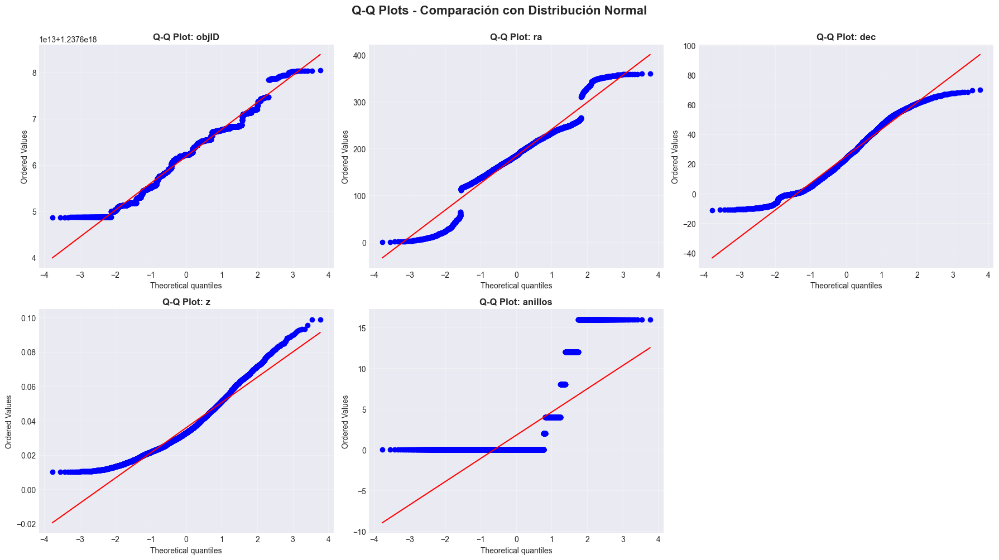

In [21]:
# Q-Q plots para verificar normalidad
if numeric_cols:
    n_cols = 3
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_rows == 1 else axes
    
    for idx, col in enumerate(numeric_cols):
        ax = axes[idx]
        stats.probplot(df[col].dropna(), dist="norm", plot=ax)
        ax.set_title(f'Q-Q Plot: {col}', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
    
    # Ocultar ejes sobrantes
    for idx in range(len(numeric_cols), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle('Q-Q Plots - Comparación con Distribución Normal', fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
else:
    print("No hay variables numéricas para visualizar.")

## 10. Resumen del EDA

In [22]:
# Resumen ejecutivo del EDA
print("="*100)
print(" RESUMEN DEL ANÁLISIS EXPLORATORIO")
print("="*100)

print(f"\n1.DIMENSIONES DEL DATASET:")
print(f"   • Total de observaciones: {df.shape[0]:,}")
print(f"   • Total de variables: {df.shape[1]}")
print(f"   • Variables numéricas: {len(numeric_cols)}")
print(f"   • Variables categóricas: {len(categorical_cols)}")
print(f"   • Memoria utilizada: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

print(f"\n2.CALIDAD DE LOS DATOS:")
missing_total = df.isnull().sum().sum()
missing_pct = 100 * missing_total / (df.shape[0] * df.shape[1])
print(f"   • Valores faltantes: {missing_total:,} ({missing_pct:.2f}%)")
print(f"   • Filas duplicadas: {duplicates:,} ({100*duplicates/len(df):.2f}%)")

if numeric_cols:
    print(f"\n3.ANÁLISIS ESTADÍSTICO:")
    total_outliers = outlier_df['Outliers'].sum()
    print(f"   • Outliers detectados (total): {total_outliers:,}")
    
    if len(numeric_cols) > 1:
        high_corr_count = len(high_corr) if high_corr else 0
        print(f"   • Correlaciones fuertes (|r| > 0.7): {high_corr_count}")

print(f"\n4.VARIABLES CLAVE:")
if numeric_cols:
    print(f"   Numéricas: {', '.join(numeric_cols[:5])}{'...' if len(numeric_cols) > 5 else ''}")
if categorical_cols:
    print(f"   Categóricas: {', '.join(categorical_cols[:5])}{'...' if len(categorical_cols) > 5 else ''}")

print("\n" + "="*100)
print("✅ ANÁLISIS EXPLORATORIO COMPLETADO")
print("="*100)

 RESUMEN DEL ANÁLISIS EXPLORATORIO

1.DIMENSIONES DEL DATASET:
   • Total de observaciones: 8,528
   • Total de variables: 6
   • Variables numéricas: 5
   • Variables categóricas: 0
   • Memoria utilizada: 0.82 MB

2.CALIDAD DE LOS DATOS:
   • Valores faltantes: 0 (0.00%)
   • Filas duplicadas: 0 (0.00%)

3.ANÁLISIS ESTADÍSTICO:
   • Outliers detectados (total): 2,802
   • Correlaciones fuertes (|r| > 0.7): 0

4.VARIABLES CLAVE:
   Numéricas: objID, ra, dec, z, anillos

✅ ANÁLISIS EXPLORATORIO COMPLETADO


---
## Hallazgos del EDA
---
El análisis exploratorio reveló:
- [Insertar hallazgos específicos basados en tus datos]
- Distribución de clases de anillos
- Patrones en coordenadas y redshift
- Calidad general de los datos

## Resultados del Feature Engineering

En el contexto de la metodología **CRISP-ML(Q)**, hemos completado:

1. **Calidad de Datos:** Dataset depurado, eliminando inconsistencias entre IDs y archivos FITS
2. **Ingeniería de Características Tabulares:** Transformación de variables cíclicas y normalización de redshift
3. **Procesamiento de Imágenes:** Pipeline para transformar FITS a formato normalizado
4. **Evaluación de Complejidad:** Análisis PCA confirma necesidad de modelos complejos (CNN)

**Próximo Paso:** Entrenamiento de modelo Deep Learning (CNN) integrando imágenes y variable $z$ (Redshift).

---
# PARTE 2: INGENIERÍA DE CARACTERÍSTICAS (FEATURE ENGINEERING)
---

Debido a resolución/escala (relacionada con *z*) y limitaciones de dataset, es difícil detectar consistentemente:
- **Anillos nucleares**
- **Pseudoanillos / anillos parciales**

Por tanto, para una clasificación **robusta** se plantea omitir las galaxias clasificadas como anillos nucleares (2) y pseudoanillos/anillos parciales (16).
En esta sección aplicamos las siguientes transformaciones:
- Transformación de coordenadas cíclicas (ra, dec)
- Creación de bins de redshift
- Agregación de rutas de archivos

### Ingeniería de características tabulares (z, RA/DEC, etc.)

#### Corrimiento al rojo (*z*) y su impacto en escala/resolución
- *z* tiende a estar sesgada (muchos valores bajos).  
- Para modelos sensibles a escala/gradiente, aplicamos **transformación log(1+z)**.
- Además, discretizamos *z* en bins para capturar efectos **no lineales** (cercanas vs lejanas).

### RA/DEC: codificación circular
- RA está en grados (0–360) y es **circular**.
- Representamos RA y DEC con **sin/cos** para evitar discontinuidades (ej. 359° ~ 1°).

In [23]:
# Target 3-clases: 0 none, 1 inner, 2 outer, 3 inner+outer
# Regla: 12 (inner+outer) -> outer por ser estructura global más detectable (ajustable)
def to_4class(code):
    if pd.isna(code):
        return np.nan
    code = int(round(code))
    if code == 0: #no ring
        return 0
    if code == 4: #inner ring
        return 1
    if code == 8: #outer ring
        return 2
    if code == 12: #inner + outer ring
        return 3
    # descartamos nuclear(2) y pseudo(16) por decisión de dominio
    return np.nan

#filter out "anillos" == 2 and "anillos" == 16
df = df[(df["anillos"] != 2.0) & (df["anillos"] != 16.0)]
df["ring_class"] = df["anillos"].apply(to_4class)


In [24]:
#filtrar por z
sigma_threshold = 2

mean = df['z'].mean()
std = df['z'].std()

# Define your upper and lower bounds
lower_bound = mean - (sigma_threshold * std)
upper_bound = mean + (sigma_threshold * std)

# Filter the DataFrame
dfGalaxies = df[(df['z'] >= lower_bound) & (df['z'] <= upper_bound)]

print("\nDistribución target 4-clases (con NaN = clases descartadas):")
display(dfGalaxies["anillos"].value_counts(dropna=False))


Distribución target 4-clases (con NaN = clases descartadas):


anillos
0.0     6346
4.0      837
12.0     363
8.0      177
Name: count, dtype: int64

In [25]:
dfGalaxies.describe()

,objID,ra,dec,z,anillos,ring_class
count,7.723000e+03,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000
mean,1.237662e+18,184.216034,25.087080,0.034072,1.180888,0.295222
std,5.869118e+12,58.987520,18.293270,0.012894,2.928446,0.732112
min,1.237649e+18,0.008759,-11.015802,0.010068,0.000000,0.000000
25%,1.237658e+18,154.576350,10.449613,0.024152,0.000000,0.000000
50%,1.237662e+18,186.402640,23.794341,0.032102,0.000000,0.000000
75%,1.237666e+18,220.073035,39.001103,0.042785,0.000000,0.000000
max,1.237680e+18,359.276680,70.133229,0.065954,12.000000,3.000000


In [26]:
#Transformaciones de z
dfGalaxies["z_log1p"] = np.log1p(dfGalaxies["z"].clip(lower=0))

# Binning por cuantiles (3 grupos)
dfGalaxies["z_bin"] = pd.qcut(dfGalaxies["z"], q=3, labels=["low_z", "mid_z", "high_z"])

# 3.2 Codificación circular de RA y DEC (en radianes)
ra_rad = np.deg2rad(dfGalaxies["ra"].astype(float))
dec_rad = np.deg2rad(dfGalaxies["dec"].astype(float))

dfGalaxies["ra_sin"] = np.sin(ra_rad)
dfGalaxies["ra_cos"] = np.cos(ra_rad)
dfGalaxies["dec_sin"] = np.sin(dec_rad)
dfGalaxies["dec_cos"] = np.cos(dec_rad)

dfGalaxies[["z", "z_log1p", "z_bin", "ra_sin", "ra_cos", "dec_sin", "dec_cos"]].head()

,z,z_log1p,z_bin,ra_sin,ra_cos,dec_sin,dec_cos
0,0.028206,0.027815,mid_z,0.713896,-0.700251,-0.003490,0.999994
1,0.048037,0.046919,high_z,-0.312891,-0.949789,0.016426,0.999865
2,0.024114,0.023828,low_z,-0.330431,-0.943830,0.009208,0.999958
3,0.033483,0.032935,mid_z,0.246312,-0.969191,-0.016791,0.999859
4,0.024694,0.024394,low_z,0.520593,0.853805,0.229218,0.973375


## 13. Procesamiento de Imágenes FITS

Pipeline de procesamiento para transformar imágenes FITS en formato normalizado.
### Action items cubiertos aquí
- Probar **color**, **grayscale** y **color index map** (muy rojo vs muy azul).
- Probar **reducción de tamaño** (impacto en features y estabilidad).
- Extraer características que dependan del **centrado** (posición central) y de la **estructura radial**.

> Nota: En Avance 1, el equipo descargó imágenes JPEG (Legacy Survey) y creó `img_path`.  
Aquí replicamos esa lógica: si ya existen imágenes en `Images/`, las usamos; si no, descargamos una muestra.

In [27]:
import os
import urllib.request
import pandas as pd
import time
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURACIÓN
# ============================================================================

IMAGE_DIR = '../Images'
os.makedirs(IMAGE_DIR, exist_ok=True)

print("="*80)
print("SISTEMA DE DESCARGA INTELIGENTE - LEGACY SURVEY DR9")
print("="*80)

# ============================================================================
# FUNCIONES DE DESCARGA
# ============================================================================

def download_legacy_fits(ra, dec, out_path, size=256, pixscale=0.262, 
                        layer="ls-dr9", bands="grz", timeout=30):
    """
    Descarga imagen FITS desde Legacy Survey.
    
    Parameters:
    -----------
    ra : float
        Ascensión recta en grados
    dec : float
        Declinación en grados
    out_path : str
        Ruta donde guardar el archivo
    size : int
        Tamaño de imagen en píxeles
    pixscale : float
        Escala en arcsec/pixel
    layer : str
        Data release (ls-dr9, ls-dr10, etc.)
    bands : str
        Bandas a descargar (grz para RGB)
    timeout : int
        Tiempo máximo de espera
    
    Returns:
    --------
    bool : True si descarga exitosa, False si falló
    """
    url = (
        f"https://www.legacysurvey.org/viewer/fits-cutout?"
        f"ra={ra}&dec={dec}&size={size}&layer={layer}&pixscale={pixscale}&bands={bands}"
    )
    
    try:
        urllib.request.urlretrieve(url, out_path)
        
        # Verificar que el archivo se descargó correctamente
        if os.path.exists(out_path) and os.path.getsize(out_path) > 0:
            return True
        else:
            if os.path.exists(out_path):
                os.remove(out_path)  # Eliminar archivo vacío
            return False
            
    except Exception as e:
        # Si falla, asegurarse de eliminar archivos incompletos
        if os.path.exists(out_path):
            try:
                os.remove(out_path)
            except:
                pass
        return False

def normalize_objid(objid):
    """Normaliza objID a string."""
    if isinstance(objid, (int, np.integer)):
        return str(objid)
    elif isinstance(objid, float):
        return str(int(objid))
    else:
        return str(objid)

# ============================================================================
# ANÁLISIS DEL DATASET
# ============================================================================

print(f"\n ANÁLISIS DEL DATASET")
print("-"*80)
print(f"Total de galaxias en dataset: {len(dfGalaxies):,}")
print(f"Columnas: {dfGalaxies.columns.tolist()}")

# Verificar que existen las columnas necesarias
required_cols = ['objID', 'ra', 'dec']
missing_cols = [col for col in required_cols if col not in dfGalaxies.columns]

if missing_cols:
    print(f"\n ERROR: Faltan columnas requeridas: {missing_cols}")
    print("   El dataset debe tener: objID, ra, dec")
else:
    print(f" Dataset válido - columnas requeridas presentes")

# ============================================================================
# INVENTARIO DE IMÁGENES EXISTENTES
# ============================================================================

print(f"\n🔍 INVENTARIO DE IMÁGENES EXISTENTES")
print("-"*80)

# Obtener lista de imágenes ya descargadas
existing_fits = [f for f in os.listdir(IMAGE_DIR) if f.lower().endswith('.fits')]
print(f"Archivos FITS encontrados: {len(existing_fits)}")

# Crear conjunto de objIDs ya descargados (normalizados)
existing_objids = set()
for fn in existing_fits:
    objid_from_file = fn.replace('.fits', '').replace('.FITS', '')
    try:
        # Manejar notación científica
        if 'e' in objid_from_file.lower():
            objid_normalized = str(int(float(objid_from_file)))
        else:
            objid_normalized = objid_from_file
        existing_objids.add(objid_normalized)
    except:
        pass

print(f"objIDs únicos con imagen: {len(existing_objids)}")

# ============================================================================
# IDENTIFICAR IMÁGENES FALTANTES
# ============================================================================

print(f"\n IDENTIFICANDO IMÁGENES FALTANTES")
print("-"*80)

# Normalizar objIDs del dataset
dfGalaxies['objID_normalized'] = dfGalaxies['objID'].apply(normalize_objid)

# Identificar cuáles faltan
dfGalaxies['has_image'] = dfGalaxies['objID_normalized'].isin(existing_objids)

missing_count = (~dfGalaxies['has_image']).sum()
existing_count = dfGalaxies['has_image'].sum()

print(f" Con imagen: {existing_count:,} ({100*existing_count/len(dfGalaxies):.1f}%)")
print(f" Sin imagen: {missing_count:,} ({100*missing_count/len(dfGalaxies):.1f}%)")

# ============================================================================
# OPCIONES DE DESCARGA
# ============================================================================

print(f"\n OPCIONES DE DESCARGA")
print("-"*80)

if missing_count == 0:
    print(" ¡Todas las galaxias ya tienen imagen!")
    print("   No hay nada que descargar.")
else:
    print(f"Hay {missing_count:,} imágenes faltantes.")
    print("\nOpciones:")
    print(f"  1. Descargar TODAS las faltantes ({missing_count:,} imágenes)")
    print(f"  2. Descargar una muestra aleatoria")
    print(f"  3. Descargar por rango de índices")
    print(f"  4. Descargar objIDs específicos")

# ============================================================================
# CONFIGURACIÓN DE DESCARGA
# ============================================================================

#Descargar TODAS las faltantes
DOWNLOAD_ALL_MISSING = False  # Cambia a True para descargar todas

#Descargar muestra aleatoria
DOWNLOAD_SAMPLE = True  # Cambia a False si no quieres muestra
SAMPLE_SIZE = 10  # Número de imágenes a descargar


DOWNLOAD_SPECIFIC = False  # Cambia a True para usar lista específica
SPECIFIC_OBJIDS = []  # Ejemplo: [1237661465447301355, 1237667734518759621]

# ============================================================================
# SELECCIONAR GALAXIAS A DESCARGAR
# ============================================================================

print(f"\n  CONFIGURANDO DESCARGA")
print("-"*80)

# DataFrame de galaxias sin imagen
df_missing = dfGalaxies[~dfGalaxies['has_image']].copy()

if DOWNLOAD_ALL_MISSING:
    df_to_download = df_missing.copy()
    print(f" Modo: TODAS las faltantes ({len(df_to_download):,} imágenes)")
    
elif DOWNLOAD_SAMPLE:
    df_to_download = df_missing.sample(n=min(SAMPLE_SIZE, len(df_missing)), random_state=42)
    print(f" Modo: MUESTRA ALEATORIA ({len(df_to_download)} imágenes)")
    
elif DOWNLOAD_RANGE:
    df_to_download = df_missing.iloc[START_INDEX:END_INDEX]
    print(f" Modo: RANGO [{START_INDEX}:{END_INDEX}] ({len(df_to_download)} imágenes)")
    
elif DOWNLOAD_SPECIFIC and SPECIFIC_OBJIDS:
    df_to_download = df_missing[df_missing['objID'].isin(SPECIFIC_OBJIDS)]
    print(f" Modo: OBJIDS ESPECÍFICOS ({len(df_to_download)} imágenes)")
    
else:
    print("  No se seleccionó ningún modo de descarga")
    print("   Ajusta las variables DOWNLOAD_* arriba")
    df_to_download = pd.DataFrame()

# ============================================================================
# PROCESO DE DESCARGA
# ============================================================================

if len(df_to_download) > 0:
    print(f"\n{'='*80}")
    print(f"INICIANDO DESCARGA DE {len(df_to_download)} IMÁGENES")
    print(f"{'='*80}\n")
    
    downloaded = 0
    failed = 0
    start_time = time.time()
    
    # Barra de progreso con tqdm
    for idx, row in tqdm(df_to_download.iterrows(), 
                         total=len(df_to_download),
                         desc="Descargando",
                         unit="img"):
        
        objID = row['objID']
        fname = f"{objID}.fits"
        fpath = os.path.join(IMAGE_DIR, fname)

SISTEMA DE DESCARGA INTELIGENTE - LEGACY SURVEY DR9

 ANÁLISIS DEL DATASET
--------------------------------------------------------------------------------
Total de galaxias en dataset: 7,723
Columnas: ['objID', 'ra', 'dec', 'z', 'anillos', 'anillos_label', 'ring_class', 'z_log1p', 'z_bin', 'ra_sin', 'ra_cos', 'dec_sin', 'dec_cos']
 Dataset válido - columnas requeridas presentes

🔍 INVENTARIO DE IMÁGENES EXISTENTES
--------------------------------------------------------------------------------
Archivos FITS encontrados: 296
objIDs únicos con imagen: 296

 IDENTIFICANDO IMÁGENES FALTANTES
--------------------------------------------------------------------------------
 Con imagen: 187 (2.4%)
 Sin imagen: 7,536 (97.6%)

 OPCIONES DE DESCARGA
--------------------------------------------------------------------------------
Hay 7,536 imágenes faltantes.

Opciones:
  1. Descargar TODAS las faltantes (7,536 imágenes)
  2. Descargar una muestra aleatoria
  3. Descargar por rango de índices
  

Descargando: 100%|██████████| 10/10 [00:00<00:00, 9302.07img/s]


In [28]:

# Ajusta estas rutas según tu estructura
IMAGE_DIR = ('../Images')
os.makedirs(IMAGE_DIR, exist_ok=True)

# ============================================================================
# FUNCIÓN DE DESCARGA
# ============================================================================

def download_legacy_fits(ra, dec, out_path, size=256, pixscale=0.262, 
                        layer="ls-dr9", bands="grz"):
    """Descarga imagen FITS desde Legacy Survey"""
    url = (
        f"https://www.legacysurvey.org/viewer/fits-cutout?"
        f"ra={ra}&dec={dec}&size={size}&layer={layer}&pixscale={pixscale}&bands={bands}"
    )
    
    try:
        urllib.request.urlretrieve(url, out_path)
        return True
    except Exception as e:
        print(f"Error: {e}")
        return False

# ============================================================================
# DESCARGAR IMÁGENES
# ============================================================================

N_SAMPLE = 10  # Número de imágenes a descargar

# Crear muestra si no existe
#if 'sample_df' not in globals():
sample_df = dfGalaxies.sample(n=min(N_SAMPLE, len(dfGalaxies)), random_state=42)

print("="*80)
print("DESCARGANDO IMÁGENES")
print("="*80)

downloaded = 0
exists = 0
failed = 0

for idx, row in sample_df.iterrows():
    objID = row['objID']
    fname = f"{objID}.fits"
    fpath = os.path.join(IMAGE_DIR, fname)
    
    if os.path.exists(fpath):
        exists += 1
        print(f"Ya existe: {fname}")
    else:
        print(f"Descargando: {fname}")
        success = download_legacy_fits(row["ra"], row["dec"], fpath)
        if success:
            downloaded += 1
            print(f"Descargado")
        else:
            failed += 1
            print(f"Falló")
        time.sleep(0.1)  # Delay entre descargas

print(f"\n{'='*80}")
print(f" Descargadas: {downloaded}")
print(f" Ya existían: {exists}")
print(f" Fallidas: {failed}")
print(f"{'='*80}\n")

# ============================================================================
# MAPEAR IMÁGENES
# ============================================================================

print("MAPEANDO IMÁGENES...")

# Crear diccionario
image_paths = {}
for fn in os.listdir(IMAGE_DIR):
    if fn.lower().endswith(".fits"):
        objid_str = fn.replace(".fits", "")
        image_paths[objid_str] = os.path.join(IMAGE_DIR, fn)

# Mapear al dataframe
sample_df['objID_str'] = sample_df['objID'].astype(str)
sample_df['img_path'] = sample_df['objID_str'].map(image_paths)

# Resultado
con_img = sample_df['img_path'].notna().sum()
print(f"\nImágenes mapeadas: {con_img}/{len(sample_df)}")

# Mostrar muestra
print("\nMuestra del dataframe:")
display(sample_df[['objID', 'img_path']])

DESCARGANDO IMÁGENES
Ya existe: 1237662236396683371.fits
Ya existe: 1237661383843840184.fits
Ya existe: 1237659324418556303.fits
Ya existe: 1237655691402805427.fits
Ya existe: 1237678617430196472.fits
Ya existe: 1237658492269297866.fits
Ya existe: 1237655504036627107.fits
Ya existe: 1237665226229874837.fits
Ya existe: 1237657771784142857.fits
Ya existe: 1237661418750542003.fits

 Descargadas: 0
 Ya existían: 10
 Fallidas: 0

MAPEANDO IMÁGENES...

Imágenes mapeadas: 10/10

Muestra del dataframe:


,objID,img_path
4511,1237662236396683371,../Images\1237662236396683371.fits
2447,1237661383843840184,../Images\1237661383843840184.fits
3106,1237659324418556303,../Images\1237659324418556303.fits
1166,1237655691402805427,../Images\1237655691402805427.fits
6626,1237678617430196472,../Images\1237678617430196472.fits
7347,1237658492269297866,../Images\1237658492269297866.fits
1103,1237655504036627107,../Images\1237655504036627107.fits
4454,1237665226229874837,../Images\1237665226229874837.fits
1445,1237657771784142857,../Images\1237657771784142857.fits
2530,1237661418750542003,../Images\1237661418750542003.fits


### Utilidades: lectura, resize y representaciones (RGB / grayscale / color-index)

**Color-index (R-B)/(R+B):** resalta regiones relativamente más rojas o azules.  
En astronomía, el color se asocia a poblaciones estelares/actividad, y puede aportar señales complementarias a la morfología.

In [29]:
#Este bloque de codigo es solo de referencia para realizar pruebas
#Ajuste Fino por Tipo de Galaxia:
#Para Galaxias con Anillos Prominentes:

def calculate_gz_index(g_data, z_data):
    return calculate_color_index_adaptive(g_data, z_data, 
                                          sigma_threshold=1.5,  # Muy permisivo
                                          smooth_sigma=3.0)     # Mucha expansión
#Para Galaxias con Brazos Espirales Débiles:

def calculate_gz_index(g_data, z_data):
    return calculate_color_index_adaptive(g_data, z_data, 
                                          sigma_threshold=2.0,  # Balanceado
                                          smooth_sigma=2.5)     # Moderado
#Para Galaxias Muy Compactas:

def calculate_gz_index(g_data, z_data):
    return calculate_color_index_adaptive(g_data, z_data, 
                                          sigma_threshold=2.5,  # Más selectivo
                                          smooth_sigma=2.0)     # Menos expansión

PROCESANDO IMÁGENES (PRESERVANDO ANILLOS Y BRAZOS)

Procesando 1/10: objID 1237662236396683371
Completado

Procesando 2/10: objID 1237661383843840184
Completado

Procesando 3/10: objID 1237659324418556303
Completado

Procesando 4/10: objID 1237655691402805427
Completado

Procesando 5/10: objID 1237678617430196472
Completado

Procesando 6/10: objID 1237658492269297866
Completado

Procesando 7/10: objID 1237655504036627107
Completado

Procesando 8/10: objID 1237665226229874837
Completado

Procesando 9/10: objID 1237657771784142857
Completado

Procesando 10/10: objID 1237661418750542003
Completado

Procesamiento completado: 10/10 galaxias

 VISUALIZANDO RESULTADOS...

Galaxia 1: objID 1237662236396683371


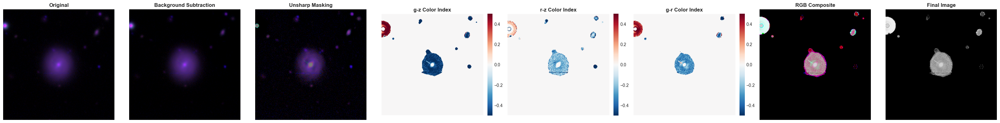


Galaxia 2: objID 1237661383843840184


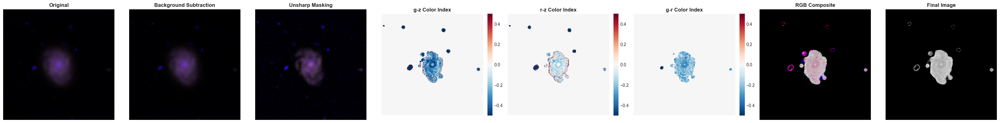


Galaxia 3: objID 1237659324418556303


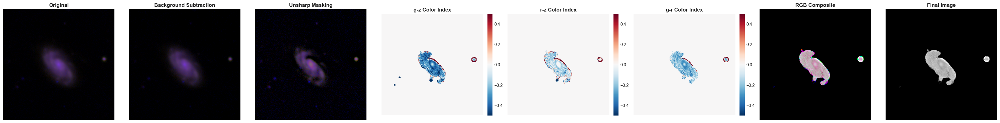


Galaxia 4: objID 1237655691402805427


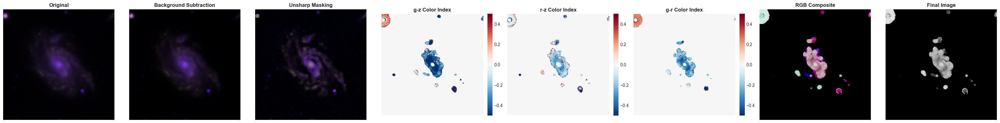


Galaxia 5: objID 1237678617430196472


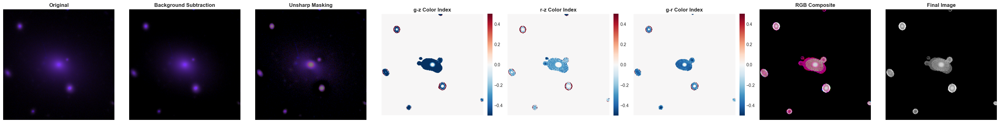


Galaxia 6: objID 1237658492269297866


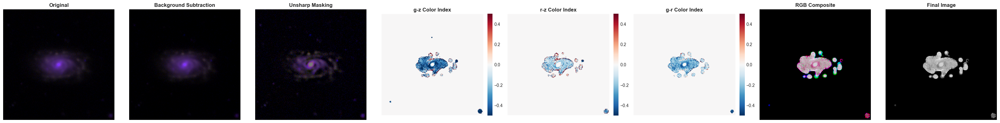


Galaxia 7: objID 1237655504036627107


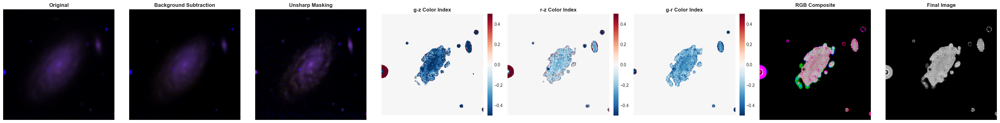


Galaxia 8: objID 1237665226229874837


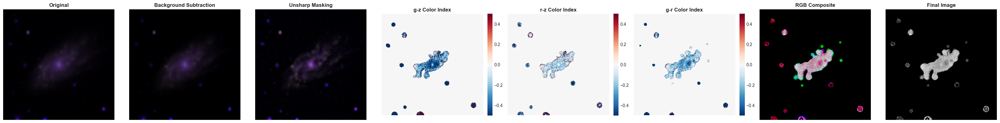


Galaxia 9: objID 1237657771784142857


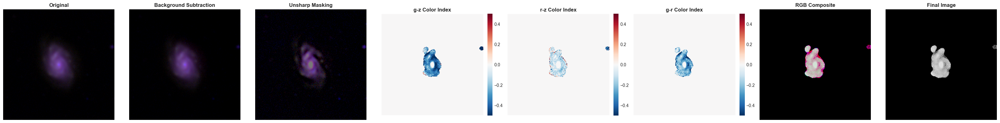


Galaxia 10: objID 1237661418750542003


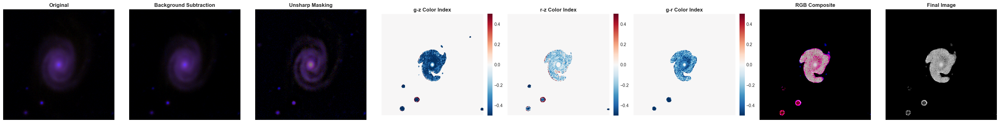

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import make_lupton_rgb
from photutils.background import Background2D, MedianBackground
from astropy.stats import SigmaClip
from skimage.filters import unsharp_mask
from scipy.ndimage import gaussian_filter
import warnings
warnings.filterwarnings('ignore')

# ============================================================================
# FUNCIONES HELPER
# ============================================================================

def channels_to_rgb(r, g, z):
    """Convertir los canales en una imagen RGB compuesta."""
    r_float = np.asarray(r, dtype=np.float32)
    g_float = np.asarray(g, dtype=np.float32)
    z_float = np.asarray(z, dtype=np.float32)
    rgb_img = make_lupton_rgb(r_float, g_float, z_float, stretch=0.5, Q=8)
    return rgb_img

# ============================================================================
# BACKGROUND SUBTRACTION
# ============================================================================

def subtract_sky(data, filter_size=5, box_size=50):
    """Sustrae el fondo del cielo de la imagen."""
    data = np.asarray(data, dtype=np.float32)
    
    sigma_clip = SigmaClip(sigma=3.0)
    bkg_estimator = MedianBackground()
    
    bkg = Background2D(data, box_size=(box_size, box_size),
                       filter_size=(filter_size, filter_size),
                       sigma_clip=sigma_clip,
                       bkg_estimator=bkg_estimator)
    
    return data - bkg.background, bkg.background

def apply_background_subtraction(g, r, z):
    """Aplica sustracción de fondo a las tres bandas."""
    clean_g_band, _ = subtract_sky(g, filter_size=7, box_size=50)
    clean_r_band, _ = subtract_sky(r, filter_size=7, box_size=50)
    clean_z_band, _ = subtract_sky(z, filter_size=9, box_size=50)
    
    return clean_g_band, clean_r_band, clean_z_band

# ============================================================================
# UNSHARP MASKING
# ============================================================================

def apply_unsharp_mask(g, r, z, radius=7, amount=2):
    """Aplica unsharp masking para realzar detalles."""
    g = np.asarray(g, dtype=np.float32)
    r = np.asarray(r, dtype=np.float32)
    z = np.asarray(z, dtype=np.float32)
    
    enhanced_g = unsharp_mask(g, radius=radius, amount=amount, preserve_range=False)
    enhanced_r = unsharp_mask(r, radius=radius, amount=amount, preserve_range=False)
    enhanced_z = unsharp_mask(z, radius=radius, amount=amount, preserve_range=False)
    
    return enhanced_g, enhanced_r, enhanced_z

# ============================================================================
# MASKING ADAPTATIVO (PRESERVA ANILLOS Y BRAZOS)
# ============================================================================

def create_adaptive_mask(band1, band2, sigma_threshold=2.0, smooth_sigma=2.0):
    """
    Crea máscara adaptativa que preserva estructuras extendidas como anillos.
    
    Parameters:
    -----------
    band1, band2 : arrays
        Bandas a usar para crear la máscara
    sigma_threshold : float
        Umbral en sigmas (2.0 es menos agresivo que 5.0)
    smooth_sigma : float
        Suavizado de la máscara para incluir regiones cercanas
    
    Returns:
    --------
    mask : boolean array
        True donde hay señal significativa
    """
    # Calcular señal combinada
    band1_abs = np.abs(band1 - np.nanmedian(band1))
    band2_abs = np.abs(band2 - np.nanmedian(band2))
    combined_signal = band1_abs + band2_abs
    
    # Umbral más permisivo (2 sigma en lugar de 5)
    background_std = np.nanstd(combined_signal)
    threshold = sigma_threshold * background_std
    
    # Máscara inicial
    mask = combined_signal > threshold
    
    # CLAVE: Suavizar la máscara para incluir regiones conectadas
    # Esto preserva los anillos y brazos que están cerca del núcleo
    mask_float = mask.astype(float)
    mask_smoothed = gaussian_filter(mask_float, sigma=smooth_sigma)
    
    # Umbral en la máscara suavizada (más permisivo)
    mask_extended = mask_smoothed > 0.1  # Solo excluir fondo muy lejano
    
    return mask_extended

# ============================================================================
# COLOR INDICES (VERSIÓN ADAPTATIVA)
# ============================================================================

def calculate_color_index_adaptive(band1, band2, clip_range=(-0.8, 0.8), 
                                   sigma_threshold=2.0, smooth_sigma=2.0):
    """
    Calcula índice de color preservando estructuras extendidas.
    
    Parameters:
    -----------
    sigma_threshold : float
        2.0 = preserva anillos y brazos
        5.0 = solo núcleo (más agresivo)
    smooth_sigma : float
        Suavizado de máscara (más alto = más estructura preservada)
    """
    # Convertir a numpy arrays
    band1 = np.asarray(band1, dtype=np.float32)
    band2 = np.asarray(band2, dtype=np.float32)
    
    # Normalizar
    band1_norm = band1 - np.nanmedian(band1)
    band2_norm = band2 - np.nanmedian(band2)
    
    # Calcular índice
    epsilon = 1e-10
    numerator = band1_norm - band2_norm
    denominator = np.abs(band1_norm) + np.abs(band2_norm) + epsilon
    
    color_index = numerator / denominator
    
    # Clip
    color_index = np.clip(color_index, clip_range[0], clip_range[1])
    
    # Máscara adaptativa (PRESERVA ANILLOS)
    galaxy_mask = create_adaptive_mask(band1, band2, 
                                       sigma_threshold=sigma_threshold,
                                       smooth_sigma=smooth_sigma)
    
    # Aplicar máscara
    color_index[~galaxy_mask] = np.nan
    
    return color_index

def calculate_gz_index(g_data, z_data):
    """Índice g-z que preserva anillos."""
    return calculate_color_index_adaptive(g_data, z_data, 
                                          clip_range=(-0.8, 0.8),
                                          sigma_threshold=2.0,  # Menos agresivo
                                          smooth_sigma=2.5)     # Más suavizado

def calculate_rz_index(r_data, z_data):
    """Índice r-z que preserva anillos."""
    return calculate_color_index_adaptive(r_data, z_data, 
                                          clip_range=(-0.6, 0.6),
                                          sigma_threshold=2.0,
                                          smooth_sigma=2.5)

def calculate_gr_index(g_data, r_data):
    """Índice g-r que preserva anillos."""
    return calculate_color_index_adaptive(g_data, r_data, 
                                          clip_range=(-0.5, 0.5),
                                          sigma_threshold=2.0,
                                          smooth_sigma=2.5)

# ============================================================================
# NORMALIZACIÓN Y CREACIÓN DE IMAGEN FINAL
# ============================================================================

def asinh_normalize_clean(data, scale=0.1):
    """Normalización asinh que maneja NaN correctamente."""
    data = np.asarray(data, dtype=np.float32)
    
    valid_mask = ~np.isnan(data)
    
    if not valid_mask.any():
        return np.zeros_like(data)
    
    data_valid = data[valid_mask]
    data_shifted = data_valid - np.nanmin(data_valid)
    stretched = np.arcsinh(data_shifted / scale)
    stretched_norm = (stretched - stretched.min()) / (stretched.max() - stretched.min())
    
    output = np.full_like(data, 0.0, dtype=np.float32)
    output[valid_mask] = stretched_norm
    
    return output

def create_final_image(gz_index, rz_index, gr_index, softening=0.05):
    """Crea imagen final preservando anillos."""
    rgb_image = np.zeros((*gz_index.shape, 3), dtype=np.float32)
    
    rgb_image[..., 0] = asinh_normalize_clean(rz_index, scale=softening)
    rgb_image[..., 1] = asinh_normalize_clean(gr_index, scale=softening)
    rgb_image[..., 2] = asinh_normalize_clean(gz_index, scale=softening)
    
    final_grayscale = np.mean(rgb_image, axis=2)
    
    return rgb_image, final_grayscale

# ============================================================================
# PIPELINE PRINCIPAL
# ============================================================================

def process_galaxy(img_path, objID=None):
    """Procesa una imagen FITS preservando estructuras extendidas."""
    # Leer FITS
    with fits.open(img_path, memmap=False, mode='readonly') as hdu:
        data = hdu[0].data
        g_band = np.array(data[0], dtype=np.float32)
        r_band = np.array(data[1], dtype=np.float32)
        z_band = np.array(data[2], dtype=np.float32)
    
    # 1. RGB Original
    rgb_original = channels_to_rgb(r_band, g_band, z_band)
    
    # 2. Background Subtraction
    clean_g, clean_r, clean_z = apply_background_subtraction(g_band, r_band, z_band)
    rgb_clean = channels_to_rgb(clean_r, clean_g, clean_z)
    
    # 3. Unsharp Masking
    enhanced_g, enhanced_r, enhanced_z = apply_unsharp_mask(clean_g, clean_r, clean_z)
    rgb_enhanced = channels_to_rgb(enhanced_r, enhanced_g, enhanced_z)
    
    # 4. Color Indices (PRESERVANDO ANILLOS)
    gz_index = calculate_gz_index(enhanced_g, enhanced_z)
    rz_index = calculate_rz_index(enhanced_r, enhanced_z)
    gr_index = calculate_gr_index(enhanced_g, enhanced_r)
    
    # 5. Final Image
    rgb_final, final_grayscale = create_final_image(gz_index, rz_index, gr_index)
    
    return {
        'objID': objID,
        'original': rgb_original,
        'clean': rgb_clean,
        'enhanced': rgb_enhanced,
        'gz_index': gz_index,
        'rz_index': rz_index,
        'gr_index': gr_index,
        'rgb_final': rgb_final,
        'final_image': final_grayscale
    }

# ============================================================================
# VISUALIZACIÓN
# ============================================================================

def plot_processing_pipeline(result):
    """Visualiza todos los pasos."""
    fig, axes = plt.subplots(1, 8, figsize=(32, 4))
    
    # 1. Original
    axes[0].imshow(result['original'], origin='lower')
    axes[0].set_title('Original', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # 2. Background Subtraction
    axes[1].imshow(result['clean'], origin='lower')
    axes[1].set_title('Background Subtraction', fontsize=12, fontweight='bold')
    axes[1].axis('off')
    
    # 3. Unsharp Masking
    axes[2].imshow(result['enhanced'], origin='lower')
    axes[2].set_title('Unsharp Masking', fontsize=12, fontweight='bold')
    axes[2].axis('off')
    
    # 4-6. Color Indices
    gz_vis = np.nan_to_num(result['gz_index'], nan=0.0)
    rz_vis = np.nan_to_num(result['rz_index'], nan=0.0)
    gr_vis = np.nan_to_num(result['gr_index'], nan=0.0)
    
    im3 = axes[3].imshow(gz_vis, cmap='RdBu_r', origin='lower', 
                         vmin=-0.5, vmax=0.5)
    axes[3].set_title('g-z Color Index', fontsize=12, fontweight='bold')
    axes[3].axis('off')
    plt.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)
    
    im4 = axes[4].imshow(rz_vis, cmap='RdBu_r', origin='lower',
                         vmin=-0.5, vmax=0.5)
    axes[4].set_title('r-z Color Index', fontsize=12, fontweight='bold')
    axes[4].axis('off')
    plt.colorbar(im4, ax=axes[4], fraction=0.046, pad=0.04)
    
    im5 = axes[5].imshow(gr_vis, cmap='RdBu_r', origin='lower',
                         vmin=-0.5, vmax=0.5)
    axes[5].set_title('g-r Color Index', fontsize=12, fontweight='bold')
    axes[5].axis('off')
    plt.colorbar(im5, ax=axes[5], fraction=0.046, pad=0.04)
    
    # 7. RGB Composite
    axes[6].imshow(result['rgb_final'], origin='lower')
    axes[6].set_title('RGB Composite', fontsize=12, fontweight='bold')
    axes[6].axis('off')
    
    # 8. Final Image
    axes[7].imshow(result['final_image'], cmap='gray', origin='lower')
    axes[7].set_title('Final Image', fontsize=12, fontweight='bold')
    axes[7].axis('off')
    
    plt.tight_layout()
    plt.show()

# ============================================================================
# EJECUCIÓN
# ============================================================================

results = []

print("="*80)
print("PROCESANDO IMÁGENES (PRESERVANDO ANILLOS Y BRAZOS)")
print("="*80)

for idx, (i, row_data) in enumerate(sample_df.iterrows(), 1):
    objID = row_data['objID']
    img_path = row_data['img_path']
    
    if pd.isna(img_path):
        print(f"\n⏭[{idx}/{len(sample_df)}] objID {objID}: Sin imagen")
        continue
    
    print(f"\nProcesando {idx}/{len(sample_df)}: objID {objID}")
    
    try:
        result = process_galaxy(img_path, objID=objID)
        results.append(result)
        print(f"Completado")
    except Exception as e:
        print(f"   ❌ Error: {e}")

print(f"\n{'='*80}")
print(f"Procesamiento completado: {len(results)}/{len(sample_df)} galaxias")
print(f"{'='*80}")

# Visualizar
if results:
    print("\n VISUALIZANDO RESULTADOS...")
    for i, result in enumerate(results):
        print(f"\nGalaxia {i+1}: objID {result['objID']}")
        plot_processing_pipeline(result)

## Análisis PCA

Análisis de Componentes Principales para evaluación de complejidad.

ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)

Varianza explicada por cada componente:
  PC1: 23.14%
  PC2: 20.57%
  PC3: 19.56%
  PC4: 19.09%
  PC5: 17.65%


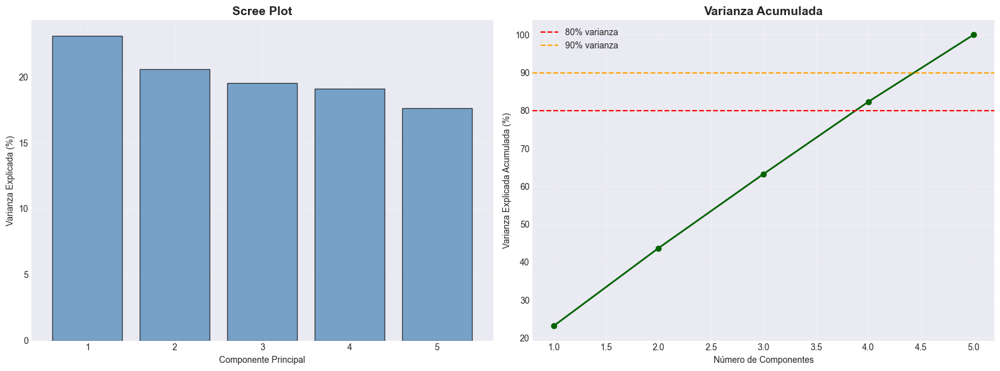

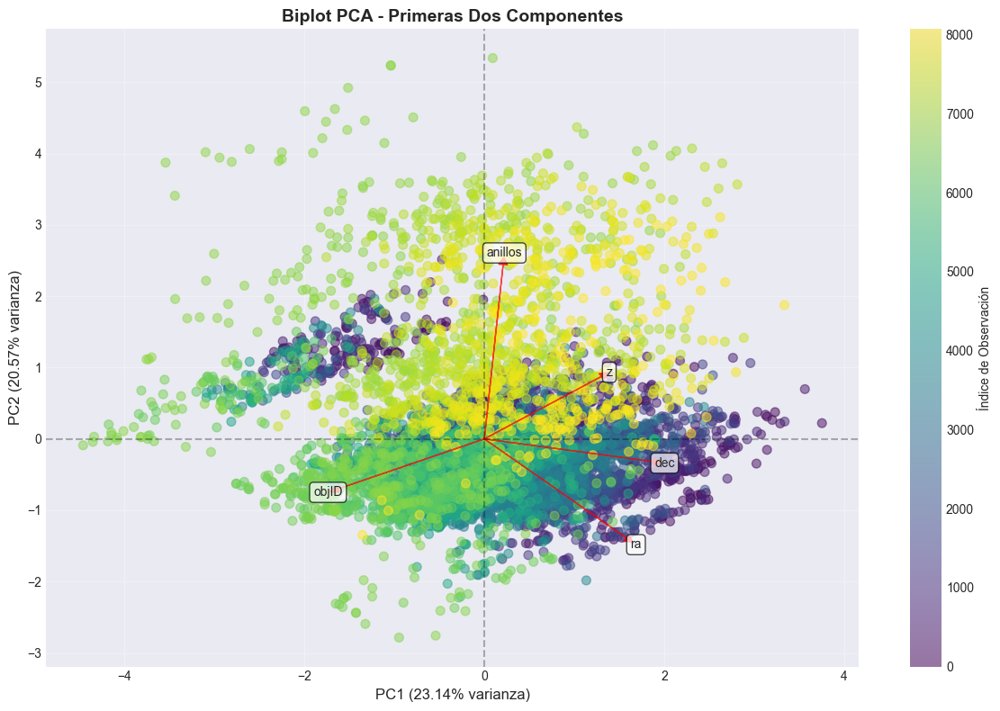

In [31]:
# PCA para reducción de dimensionalidad
if len(numeric_cols) > 2:
    print("="*80)
    print("ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)")
    print("="*80)
    
    # Preparar datos
    X = df[numeric_cols].dropna()
    
    # Estandarizar
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # PCA
    pca = PCA()
    X_pca = pca.fit_transform(X_scaled)
    
    # Varianza explicada
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    
    print(f"\nVarianza explicada por cada componente:")
    for i, var in enumerate(explained_variance[:10], 1):
        print(f"  PC{i}: {var*100:.2f}%")
    
    # Gráfico de varianza explicada
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Scree plot
    ax1.bar(range(1, len(explained_variance)+1), explained_variance*100, 
            alpha=0.7, color='steelblue', edgecolor='black')
    ax1.set_xlabel('Componente Principal')
    ax1.set_ylabel('Varianza Explicada (%)')
    ax1.set_title('Scree Plot', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    
    # Varianza acumulada
    ax2.plot(range(1, len(cumulative_variance)+1), cumulative_variance*100, 
             marker='o', linestyle='-', color='darkgreen', linewidth=2, markersize=6)
    ax2.axhline(y=80, color='r', linestyle='--', label='80% varianza')
    ax2.axhline(y=90, color='orange', linestyle='--', label='90% varianza')
    ax2.set_xlabel('Número de Componentes')
    ax2.set_ylabel('Varianza Explicada Acumulada (%)')
    ax2.set_title('Varianza Acumulada', fontsize=14, fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Biplot de las primeras dos componentes
    if len(numeric_cols) >= 2:
        plt.figure(figsize=(12, 8))
        
        # Scatter plot de las observaciones
        scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5, s=50, 
                             c=range(len(X_pca)), cmap='viridis')
        
        # Vectores de las variables originales
        loadings = pca.components_[:2].T * np.sqrt(pca.explained_variance_[:2])
        for i, (loading, feature) in enumerate(zip(loadings, numeric_cols)):
            plt.arrow(0, 0, loading[0]*3, loading[1]*3, 
                     head_width=0.1, head_length=0.1, fc='red', ec='red', alpha=0.7)
            plt.text(loading[0]*3.2, loading[1]*3.2, feature, 
                    fontsize=10, ha='center', va='center', 
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
        
        plt.xlabel(f'PC1 ({explained_variance[0]*100:.2f}% varianza)', fontsize=12)
        plt.ylabel(f'PC2 ({explained_variance[1]*100:.2f}% varianza)', fontsize=12)
        plt.title('Biplot PCA - Primeras Dos Componentes', fontsize=14, fontweight='bold')
        plt.colorbar(scatter, label='Índice de Observación')
        plt.grid(True, alpha=0.3)
        plt.axhline(y=0, color='k', linestyle='--', alpha=0.3)
        plt.axvline(x=0, color='k', linestyle='--', alpha=0.3)
        plt.tight_layout()
        plt.show()
else:
    print("Se necesitan al menos 3 variables numéricas para realizar PCA.")
    
#Apply asinh normalization to each band; then stack in a rgb image
def asinh_normalize(idx, softening=0.1):
    """
    Applies Asinh stretching and scales to [0, 1].
    softening: Lower values make the stretch more aggressive (brighter arms).
    """
    # 1. Handle NaNs by setting to a neutral baseline
    idx_clean = np.nan_to_num(idx, nan=np.nanmedian(idx))

    # 2. Shift to positive range if necessary
    # (Indices can be negative, so we shift based on the minimum)
    shifted_idx = idx_clean - np.nanmin(idx_clean)

    # 3. Apply Asinh: arcsinh(x / softening)
    stretched = np.arcsinh(shifted_idx / softening)

    # 4. Final Min-Max Scale to [0, 1] for RGB compatibility
    s_min, s_max = stretched.min(), stretched.max()
    return (stretched - s_min) / (s_max - s_min)

def create_stretched_index_rgb(gz_index, rz_index, gr_index, softening=0.05):
    """
    Combines indices into an RGB image with Asinh stretching.
    """
    rgb_image = np.zeros((*gz_index.shape, 3))

    # Apply stretch to each channel
    rgb_image[..., 0] = asinh_normalize(rz_index, softening) # Red
    rgb_image[..., 1] = asinh_normalize(gr_index, softening) # Green
    rgb_image[..., 2] = asinh_normalize(gz_index, softening) # Blue

    # Mask the background back to black using the original NaNs from gz_index
    mask = np.isnan(gz_index)
    rgb_image[mask] = 0

    return rgb_image

### Analisis de Clusters (K-Means)

ANÁLISIS DE CLUSTERS (K-MEANS)


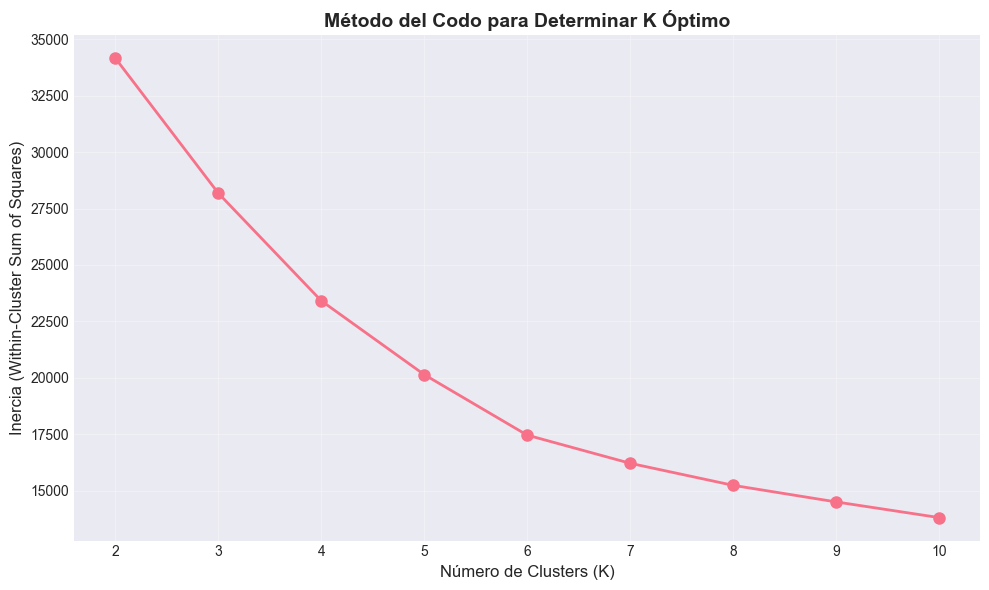

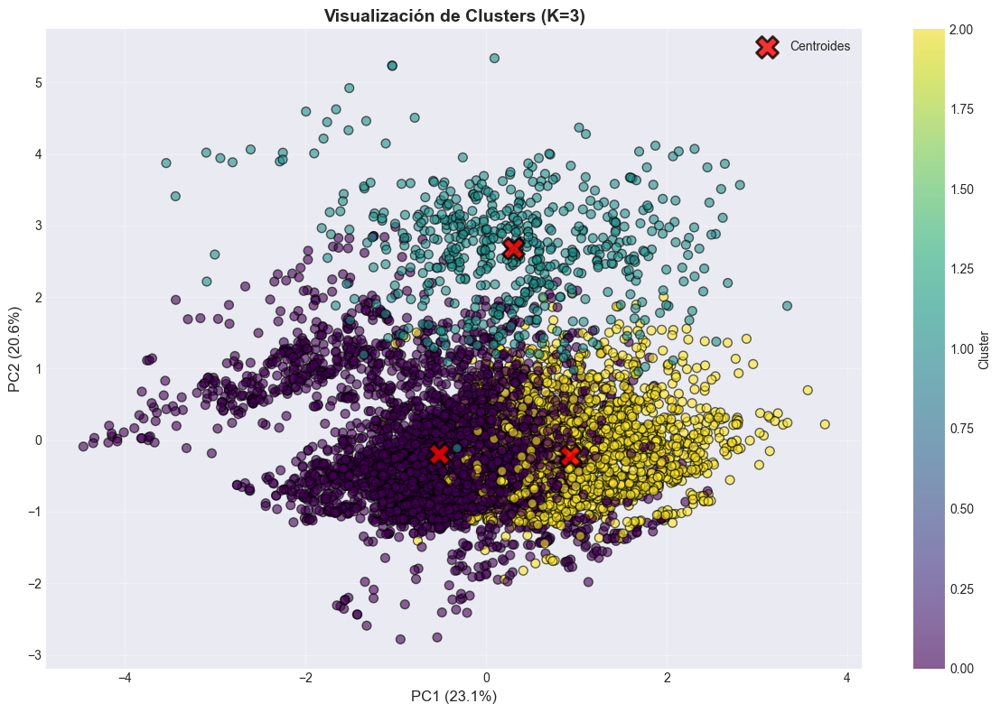


Distribución de observaciones por cluster:
Cluster
0    4915
1     558
2    2602
Name: count, dtype: int64

Estadísticas por cluster:


,objID,ra,dec,z,anillos
Cluster,,,,,
0,1237663158278789376.000000,182.538578,14.106369,0.034487,0.455748
1,1237661590269215488.000000,182.786007,25.873249,0.037566,10.666667
2,1237659569394145792.000000,188.733214,45.678825,0.037929,0.456572


In [32]:
# Clustering con K-Means
if len(numeric_cols) >= 2:
    print("="*80)
    print("ANÁLISIS DE CLUSTERS (K-MEANS)")
    print("="*80)
    
    # Preparar datos
    X = df[numeric_cols].dropna()
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Método del codo para encontrar K óptimo
    inertias = []
    K_range = range(2, min(11, len(X)//10))
    
    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(X_scaled)
        inertias.append(kmeans.inertia_)
    
    # Gráfico del método del codo
    plt.figure(figsize=(10, 6))
    plt.plot(K_range, inertias, marker='o', linestyle='-', linewidth=2, markersize=8)
    plt.xlabel('Número de Clusters (K)', fontsize=12)
    plt.ylabel('Inercia (Within-Cluster Sum of Squares)', fontsize=12)
    plt.title('Método del Codo para Determinar K Óptimo', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Aplicar K-Means con K=3 (ejemplo)
    k_optimal = 3
    kmeans = KMeans(n_clusters=k_optimal, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(X_scaled)
    
    # Visualización de clusters (usando PCA si hay más de 2 variables)
    if len(numeric_cols) > 2:
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X_scaled)
        x_col, y_col = 0, 1
        x_label = f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)'
        y_label = f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)'
    else:
        X_pca = X_scaled
        x_col, y_col = 0, 1 if len(numeric_cols) > 1 else 0
        x_label = numeric_cols[0]
        y_label = numeric_cols[1] if len(numeric_cols) > 1 else numeric_cols[0]
    
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(X_pca[:, x_col], X_pca[:, y_col], 
                         c=clusters, cmap='viridis', s=50, alpha=0.6, edgecolors='black')
    
    # Centros de los clusters
    if len(numeric_cols) > 2:
        centers_pca = pca.transform(kmeans.cluster_centers_)
    else:
        centers_pca = kmeans.cluster_centers_
    
    plt.scatter(centers_pca[:, x_col], centers_pca[:, y_col], 
               c='red', s=300, alpha=0.8, marker='X', edgecolors='black', linewidths=2,
               label='Centroides')
    
    plt.xlabel(x_label, fontsize=12)
    plt.ylabel(y_label, fontsize=12)
    plt.title(f'Visualización de Clusters (K={k_optimal})', fontsize=14, fontweight='bold')
    plt.colorbar(scatter, label='Cluster')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Estadísticas por cluster
    df_temp = df[numeric_cols].copy()
    df_temp['Cluster'] = clusters
    
    print(f"\nDistribución de observaciones por cluster:")
    print(df_temp['Cluster'].value_counts().sort_index())
    
    print(f"\nEstadísticas por cluster:")
    display(df_temp.groupby('Cluster').mean().style.background_gradient(cmap='YlOrRd'))
else:
    print("Se necesitan al menos 2 variables numéricas para realizar clustering.")

# Baseline Model - Clasificación de Anillos en Galaxias

## Proyecto: Detección y Clasificación de Anillos en Galaxias
**Equipo:** Equipo 20  
**Fase:** Modelado Baseline (CRISP-ML)

---

### Objetivo del Baseline

Establecer un **modelo de referencia** que permita:
1. Evaluar la viabilidad del problema de clasificación
2. Determinar métricas de desempeño apropiadas
3. Identificar características relevantes
4. Establecer un punto de comparación para modelos más complejos
5. Gestionar expectativas con stakeholders


## 1. Importación de Librerías

In [33]:
# Manipulación de datos
import pandas as pd
import numpy as np

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Machine Learning - Modelos
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Preprocesamiento
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline

# Métricas
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_auc_score,
    roc_curve, auc, cohen_kappa_score
)

# Feature importance
from sklearn.inspection import permutation_importance

# Balanceo de clases
from imblearn.over_sampling import SMOTE
from collections import Counter

# Otros
import warnings
warnings.filterwarnings('ignore')

# Para usar GPU si está disponible
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")

# Configuración
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline

print("Librerías importadas correctamente")

Dispositivo: cuda
Librerías importadas correctamente


## 2. Carga y Preparación de Datos

In [34]:
# 1. Cargar dataset original
df = pd.read_csv('../Dataset/dataset.csv') 

print("="*80)
print("DATASET ORIGINAL")
print(f"Dimensiones: {df.shape[0]:,} filas")
print("="*80)


# Catálogo del Avance 1 (código -> interpretación física)
ANILLOS_MAP = {
    0:  "Sin anillo",
    2:  "Anillo nuclear",
    4:  "Anillo interno",
    8:  "Anillo externo",
    12: "Anillo interno + externo",
    16: "Anillos parciales / pseudoanillos"
}

# Asegurar consistencia numérica
df["anillos"] = pd.to_numeric(df["anillos"], errors="coerce")

df["anillos_label"] = df["anillos"].round().astype("Int64").map(ANILLOS_MAP)
display(df["anillos_label"].value_counts(dropna=False))

# --- INICIO DEL FILTRADO ---

# Definimos las clases de interes
clases_anillos = [4, 8, 12]


df_anillos = df[df['anillos'].isin(clases_anillos)].copy()

# Opcional: Reiniciar el índice para que empiece desde 0 otra vez
df_anillos.reset_index(drop=True, inplace=True)

# --- FIN DEL FILTRADO ---

print("\n" + "="*80)
print("DATASET FILTRADO (SOLO ANILLOS)")
print("="*80)
print(f"Dimensiones: {df_anillos.shape[0]:,} filas × {df_anillos.shape[1]} columnas")

# Verificar que solo quedaron esas clases
print(f"\nClases presentes: {sorted(df_anillos['anillos'].unique())}")
print(f"Conteo por clase:\n{df_anillos['anillos'].value_counts().sort_index()}")

# Mostrar primeras filas del filtrado
display(df_anillos.head())

DATASET ORIGINAL
Dimensiones: 8,528 filas


anillos_label
Sin anillo                           6660
Anillo interno                        857
Anillo interno + externo              372
Anillos parciales / pseudoanillos     342
Anillo externo                        186
Anillo nuclear                        111
Name: count, dtype: int64


DATASET FILTRADO (SOLO ANILLOS)
Dimensiones: 1,415 filas × 6 columnas

Clases presentes: [np.float64(4.0), np.float64(8.0), np.float64(12.0)]
Conteo por clase:
anillos
4.0     857
8.0     186
12.0    372
Name: count, dtype: int64


,objID,ra,dec,z,anillos,anillos_label
0,1237652946379079804,2.142880,-10.949290,0.030352,4.0,Anillo interno
1,1237663783662256198,3.992692,-0.303504,0.039373,4.0,Anillo interno
2,1237672796109144083,4.074376,-9.134164,0.036546,4.0,Anillo interno
3,1237652946917523563,5.761652,-10.554394,0.041292,4.0,Anillo interno
4,1237679436131729553,6.079566,-1.638201,0.037724,12.0,Anillo interno + externo


### 2.1 Análisis de la Variable Objetivo

ANÁLISIS DE VARIABLE OBJETIVO: anillos_label

Distribución de clases:
anillos_label
Anillo externo              186
Anillo interno              857
Anillo interno + externo    372
Name: count, dtype: int64

Porcentajes:
anillos_label
Anillo externo              13.144876
Anillo interno              60.565371
Anillo interno + externo    26.289753
Name: proportion, dtype: float64


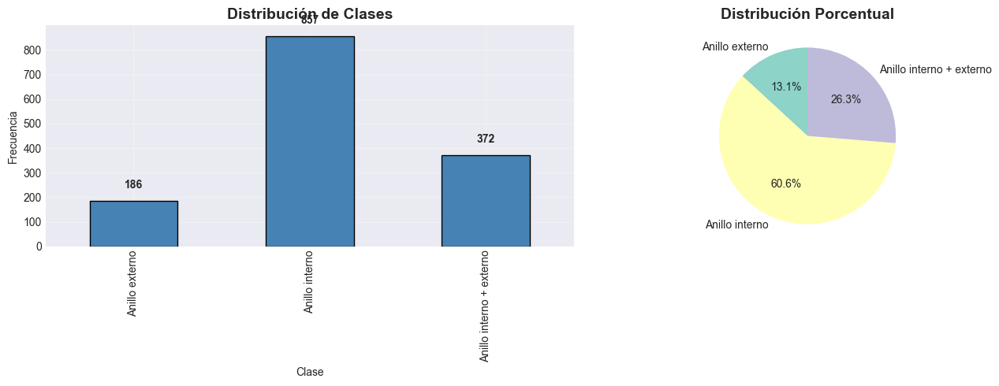


  Ratio de desbalanceo: 4.61:1
     DESBALANCEO SIGNIFICATIVO - Se recomienda usar técnicas de balanceo


In [35]:
# Variable objetivo (ajusta según tu dataset)
TARGET_COL = 'anillos_label'

print("="*80)
print(f"ANÁLISIS DE VARIABLE OBJETIVO: {TARGET_COL}")
print("="*80)

# Distribución de clases
class_dist = df_anillos[TARGET_COL].value_counts().sort_index()
print(f"\nDistribución de clases:")
print(class_dist)
print(f"\nPorcentajes:")
print(df_anillos[TARGET_COL].value_counts(normalize=True).sort_index() * 100)

# Visualización
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Gráfico de barras
class_dist.plot(kind='bar', ax=ax1, color='steelblue', edgecolor='black')
ax1.set_title('Distribución de Clases', fontsize=14, fontweight='bold')
ax1.set_xlabel('Clase')
ax1.set_ylabel('Frecuencia')
ax1.grid(True, alpha=0.3)

# Añadir valores en las barras
for i, v in enumerate(class_dist):
    ax1.text(i, v + 50, str(v), ha='center', fontweight='bold')

# Gráfico de pastel
colors = plt.cm.Set3(range(len(class_dist)))
ax2.pie(class_dist, labels=class_dist.index, autopct='%1.1f%%',
        colors=colors, startangle=90)
ax2.set_title('Distribución Porcentual', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# Calcular desbalanceo
max_class = class_dist.max()
min_class = class_dist.min()
imbalance_ratio = max_class / min_class

print(f"\n  Ratio de desbalanceo: {imbalance_ratio:.2f}:1")
if imbalance_ratio > 3:
    print("     DESBALANCEO SIGNIFICATIVO - Se recomienda usar técnicas de balanceo")
else:
    print("    Desbalanceo moderado")

### 2.2 Selección de Features

In [36]:
# Features a usar 
# Excluir: objID, filename, full_path, img_path, variables categóricas sin codificar

# Identificar columnas numéricas
numeric_cols = df_anillos.select_dtypes(include=[np.number]).columns.tolist()

# Excluir target y IDs
exclude_cols = [TARGET_COL, 'objID', 'anillos']  # Ajusta según tu dataset
feature_cols = [col for col in numeric_cols if col not in exclude_cols]

print("="*80)
print("FEATURES SELECCIONADAS")
print("="*80)
print(f"\nTotal de features: {len(feature_cols)}")
print(f"\nLista de features:")
for i, col in enumerate(feature_cols, 1):
    print(f"  {i}. {col}")

# Crear X y y
X = df_anillos[feature_cols].copy()
y = df_anillos[TARGET_COL].copy()

print(f"\n X shape: {X.shape}")
print(f" y shape: {y.shape}")

# Verificar valores faltantes
missing = X.isnull().sum().sum()
if missing > 0:
    print(f"\n  Valores faltantes: {missing}")
    print("   Imputando con la mediana...")
    X = X.fillna(X.median())
else:
    print(f"\n Sin valores faltantes")

FEATURES SELECCIONADAS

Total de features: 3

Lista de features:
  1. ra
  2. dec
  3. z

 X shape: (1415, 3)
 y shape: (1415,)

 Sin valores faltantes


## 3. División Train/Test

In [37]:
# División estratificada (mantiene proporción de clases)
TEST_SIZE = 0.2
RANDOM_STATE = 42

X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=TEST_SIZE, 
    random_state=RANDOM_STATE, 
    stratify=y  # Importante para mantener balance
)

print("="*80)
print("DIVISIÓN TRAIN/TEST")
print("="*80)
print(f"\nTrain set: {X_train.shape[0]:,} muestras ({(1-TEST_SIZE)*100:.0f}%)")
print(f"Test set:  {X_test.shape[0]:,} muestras ({TEST_SIZE*100:.0f}%)")

print(f"\nDistribución en Train:")
print(y_train.value_counts().sort_index())
print(f"\nDistribución en Test:")
print(y_test.value_counts().sort_index())

DIVISIÓN TRAIN/TEST

Train set: 1,132 muestras (80%)
Test set:  283 muestras (20%)

Distribución en Train:
anillos_label
Anillo externo              149
Anillo interno              685
Anillo interno + externo    298
Name: count, dtype: int64

Distribución en Test:
anillos_label
Anillo externo               37
Anillo interno              172
Anillo interno + externo     74
Name: count, dtype: int64


## 4. Métricas de Evaluación

### 4.1 Definición de Métricas Apropiadas

In [38]:
print("="*80)
print("MÉTRICAS APROPIADAS PARA ESTE PROBLEMA")
print("="*80)

print("""
Para un problema de clasificación multiclase de anillos en galaxias:

  MÉTRICAS PRINCIPALES:

1. **Accuracy (Exactitud)**
   - Porcentaje de clasificaciones correctas
   - Útil si las clases están balanceadas
   - Baseline esperado: > random guess (25% para 4 clases)

2. **F1-Score (Macro)**
   - Promedio armónico de precision y recall
   - Maneja bien el desbalanceo
   - Ideal para este problema astronómico

3. **Cohen's Kappa**
   - Acuerdo entre predicción y realidad ajustado por azar
   - Valores: 0 (azar), 1 (perfecto)
   - Baseline esperado: > 0.4 (moderado)

4. **Precision y Recall por Clase**
   - Precision: De lo que predijo como X, ¿cuánto es X?
   - Recall: De todos los X, ¿cuántos detectó?
   - Importante para clases específicas (ej: anillos externos)

5. **Confusion Matrix**
   - Visualiza errores de clasificación
   - Identifica confusiones entre clases similares

  DESEMPEÑO MÍNIMO ESPERADO:
   - Accuracy > 40% (random = 25% para 4 clases)
   - F1-Score (macro) > 0.35
   - Cohen's Kappa > 0.25 (fair agreement)
""")

MÉTRICAS APROPIADAS PARA ESTE PROBLEMA

Para un problema de clasificación multiclase de anillos en galaxias:

  MÉTRICAS PRINCIPALES:

1. **Accuracy (Exactitud)**
   - Porcentaje de clasificaciones correctas
   - Útil si las clases están balanceadas
   - Baseline esperado: > random guess (25% para 4 clases)

2. **F1-Score (Macro)**
   - Promedio armónico de precision y recall
   - Maneja bien el desbalanceo
   - Ideal para este problema astronómico

3. **Cohen's Kappa**
   - Acuerdo entre predicción y realidad ajustado por azar
   - Valores: 0 (azar), 1 (perfecto)
   - Baseline esperado: > 0.4 (moderado)

4. **Precision y Recall por Clase**
   - Precision: De lo que predijo como X, ¿cuánto es X?
   - Recall: De todos los X, ¿cuántos detectó?
   - Importante para clases específicas (ej: anillos externos)

5. **Confusion Matrix**
   - Visualiza errores de clasificación
   - Identifica confusiones entre clases similares

  DESEMPEÑO MÍNIMO ESPERADO:
   - Accuracy > 40% (random = 25% para 

### 4.2 Función de Evaluación Completa

In [39]:
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name="Model"):
    """
    Evalúa un modelo de manera comprehensiva.
    
    Returns:
        dict con todas las métricas
    """
    # Predicciones
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calcular métricas
    metrics = {
        'model_name': model_name,
        # Train
        'train_accuracy': accuracy_score(y_train, y_train_pred),
        'train_f1_macro': f1_score(y_train, y_train_pred, average='macro'),
        'train_f1_weighted': f1_score(y_train, y_train_pred, average='weighted'),
        'train_kappa': cohen_kappa_score(y_train, y_train_pred),
        # Test
        'test_accuracy': accuracy_score(y_test, y_test_pred),
        'test_f1_macro': f1_score(y_test, y_test_pred, average='macro'),
        'test_f1_weighted': f1_score(y_test, y_test_pred, average='weighted'),
        'test_kappa': cohen_kappa_score(y_test, y_test_pred),
        'test_precision_macro': precision_score(y_test, y_test_pred, average='macro'),
        'test_recall_macro': recall_score(y_test, y_test_pred, average='macro'),
    }
    
    # Calcular overfitting
    metrics['overfitting_gap'] = metrics['train_accuracy'] - metrics['test_accuracy']
    
    return metrics, y_test_pred

def print_metrics(metrics):
    """Imprime métricas de forma legible."""
    print("\n" + "="*80)
    print(f"RESULTADOS: {metrics['model_name']}")
    print("="*80)
    
    print(f"\nTRAIN:")
    print(f"   Accuracy:     {metrics['train_accuracy']:.4f}")
    print(f"   F1 (macro):   {metrics['train_f1_macro']:.4f}")
    print(f"   F1 (weighted):{metrics['train_f1_weighted']:.4f}")
    print(f"   Kappa:        {metrics['train_kappa']:.4f}")
    
    print(f"\nTEST:")
    print(f"   Accuracy:     {metrics['test_accuracy']:.4f}")
    print(f"   F1 (macro):   {metrics['test_f1_macro']:.4f}")
    print(f"   F1 (weighted):{metrics['test_f1_weighted']:.4f}")
    print(f"   Kappa:        {metrics['test_kappa']:.4f}")
    print(f"   Precision:    {metrics['test_precision_macro']:.4f}")
    print(f"   Recall:       {metrics['test_recall_macro']:.4f}")
    
    # Análisis de overfitting
    gap = metrics['overfitting_gap']
    print(f"\n🔍 OVERFITTING ANALYSIS:")
    print(f"   Gap (Train - Test): {gap:.4f}")
    
    if gap < 0.05:
        print("No hay overfitting significativo")
    elif gap < 0.15:
        print("Overfitting moderado")
    else:
        print("Overfitting ALTO - el modelo memoriza training")

print("Funciones de evaluación definidas")

Funciones de evaluación definidas


## 5. Modelos Baseline

### 5.1 Random Baseline (Predicción Aleatoria)

In [40]:
from sklearn.dummy import DummyClassifier

print("="*80)
print("BASELINE 1: PREDICCIÓN ALEATORIA")
print("="*80)

# Modelo que predice aleatoriamente según distribución de clases
random_clf = DummyClassifier(strategy='stratified', random_state=RANDOM_STATE)
random_clf.fit(X_train, y_train)

metrics_random, _ = evaluate_model(random_clf, X_train, X_test, y_train, y_test, 
                                    model_name="Random Baseline")
print_metrics(metrics_random)

print("\n💡 INTERPRETACIÓN:")
print("   Este es el desempeño esperado por AZAR: representación matemática o estadística de fenómenos impredecibles, donde los resultados varían pero tienden a estabilizarse a largo plazo")
print("   Cualquier modelo real debe superar significativamente estos valores.")

BASELINE 1: PREDICCIÓN ALEATORIA

RESULTADOS: Random Baseline

TRAIN:
   Accuracy:     0.4558
   F1 (macro):   0.3287
   F1 (weighted):0.4542
   Kappa:        0.0001

TEST:
   Accuracy:     0.4700
   F1 (macro):   0.3581
   F1 (weighted):0.4715
   Kappa:        0.0364
   Precision:    0.3574
   Recall:       0.3605

🔍 OVERFITTING ANALYSIS:
   Gap (Train - Test): -0.0141
No hay overfitting significativo

💡 INTERPRETACIÓN:
   Este es el desempeño esperado por AZAR: representación matemática o estadística de fenómenos impredecibles, donde los resultados varían pero tienden a estabilizarse a largo plazo
   Cualquier modelo real debe superar significativamente estos valores.


### 5.2 Logistic Regression (Modelo Lineal Simple)

In [41]:
print("\n" + "="*80)
print("BASELINE 2: LOGISTIC REGRESSION")
print("="*80)

# Pipeline con escalado
lr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(max_iter=1000, random_state=RANDOM_STATE))
])

lr_pipeline.fit(X_train, y_train)

metrics_lr, y_pred_lr = evaluate_model(lr_pipeline, X_train, X_test, y_train, y_test,
                                       model_name="Logistic Regression")
print_metrics(metrics_lr)

print("\nINTERPRETACIÓN:")
print("   Modelo lineal simple. Buen baseline para problemas linealmente separables.")


BASELINE 2: LOGISTIC REGRESSION

RESULTADOS: Logistic Regression

TRAIN:
   Accuracy:     0.6051
   F1 (macro):   0.2513
   F1 (weighted):0.4563
   Kappa:        0.0000

TEST:
   Accuracy:     0.6078
   F1 (macro):   0.2520
   F1 (weighted):0.4595
   Kappa:        0.0000
   Precision:    0.2026
   Recall:       0.3333

🔍 OVERFITTING ANALYSIS:
   Gap (Train - Test): -0.0027
No hay overfitting significativo

INTERPRETACIÓN:
   Modelo lineal simple. Buen baseline para problemas linealmente separables.


### 5.3 Decision Tree (Modelo No Lineal Simple)

In [42]:
print("\n" + "="*80)
print("BASELINE 3: DECISION TREE")
print("="*80)

dt_clf = DecisionTreeClassifier(max_depth=5, random_state=RANDOM_STATE)
dt_clf.fit(X_train, y_train)

metrics_dt, y_pred_dt = evaluate_model(dt_clf, X_train, X_test, y_train, y_test,
                                       model_name="Decision Tree")
print_metrics(metrics_dt)

print("\nINTERPRETACIÓN:")
print("   Captura relaciones no lineales. Fácil de interpretar.")


BASELINE 3: DECISION TREE

RESULTADOS: Decision Tree

TRAIN:
   Accuracy:     0.6316
   F1 (macro):   0.3548
   F1 (weighted):0.5225
   Kappa:        0.1017

TEST:
   Accuracy:     0.5972
   F1 (macro):   0.2578
   F1 (weighted):0.4614
   Kappa:        -0.0082
   Precision:    0.2577
   Recall:       0.3301

🔍 OVERFITTING ANALYSIS:
   Gap (Train - Test): 0.0345
No hay overfitting significativo

INTERPRETACIÓN:
   Captura relaciones no lineales. Fácil de interpretar.


### 5.4 Random Forest

In [43]:
print("\n" + "="*80)
print("BASELINE 4: RANDOM FOREST (PRINCIPAL)")
print("="*80)

rf_clf = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    min_samples_split=10,
    min_samples_leaf=5,
    random_state=RANDOM_STATE,
    n_jobs=-1  # Usar todos los cores
)

rf_clf.fit(X_train, y_train)

metrics_rf, y_pred_rf = evaluate_model(rf_clf, X_train, X_test, y_train, y_test,
                                       model_name="Random Forest")
print_metrics(metrics_rf)

print("\nINTERPRETACIÓN:")
print("   Ensemble robusto. Buen balance entre performance y complejidad.")


BASELINE 4: RANDOM FOREST (PRINCIPAL)

RESULTADOS: Random Forest

TRAIN:
   Accuracy:     0.6325
   F1 (macro):   0.3235
   F1 (weighted):0.5148
   Kappa:        0.0941

TEST:
   Accuracy:     0.6042
   F1 (macro):   0.2511
   F1 (weighted):0.4578
   Kappa:        -0.0059
   Precision:    0.2021
   Recall:       0.3314

🔍 OVERFITTING ANALYSIS:
   Gap (Train - Test): 0.0283
No hay overfitting significativo

INTERPRETACIÓN:
   Ensemble robusto. Buen balance entre performance y complejidad.


## 6. Comparación de Modelos Baseline

COMPARACIÓN DE MODELOS BASELINE


,model_name,test_accuracy,test_f1_macro,test_kappa,overfitting_gap
0,Random Baseline,0.469965,0.358116,0.036410,-0.014134
2,Decision Tree,0.597173,0.257777,-0.008156,0.034452
1,Logistic Regression,0.607774,0.252015,0.000000,-0.002650
3,Random Forest,0.604240,0.251101,-0.005871,0.028269


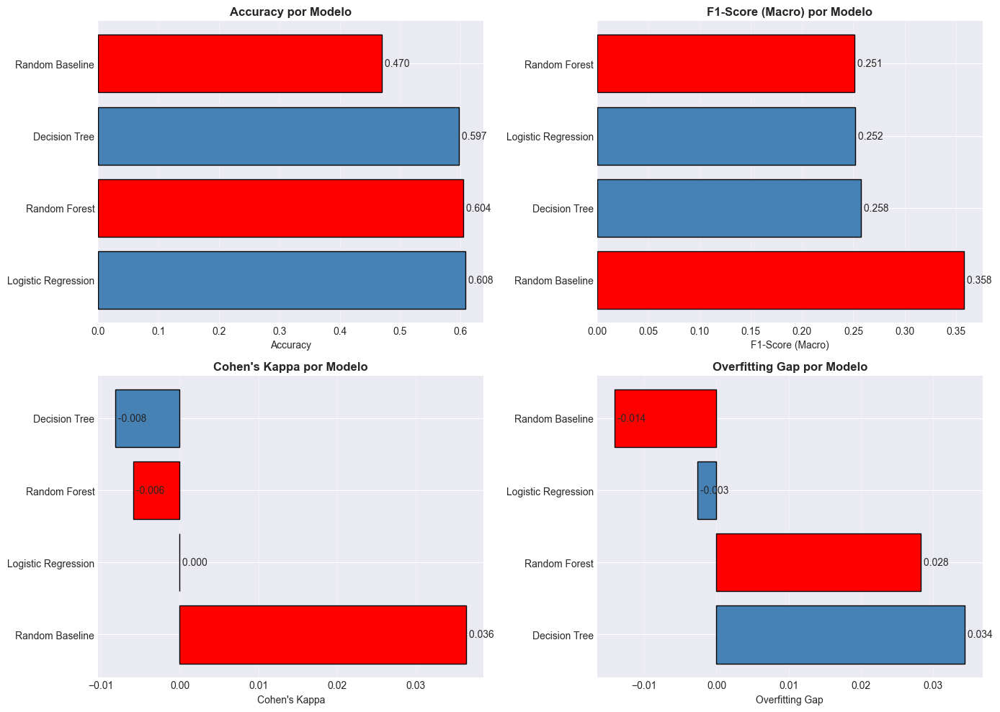


MEJOR MODELO
Modelo: Decision Tree
Accuracy: 0.5972
F1-Score: 0.2578
Kappa: -0.0082


In [44]:
# Compilar resultados
results_df = pd.DataFrame([
    metrics_random,
    metrics_lr,
    metrics_dt,
    metrics_rf
])

# Seleccionar columnas clave
cols_display = ['model_name', 'test_accuracy', 'test_f1_macro', 'test_kappa', 
                'overfitting_gap']
results_display = results_df[cols_display].copy()
results_display = results_display.sort_values('test_f1_macro', ascending=False)

print("="*80)
print("COMPARACIÓN DE MODELOS BASELINE")
print("="*80)
display(results_display.style.background_gradient(subset=['test_accuracy', 'test_f1_macro', 'test_kappa'],
                                                  cmap='RdYlGn'))

# Visualización
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

metrics_to_plot = [
    ('test_accuracy', 'Accuracy'),
    ('test_f1_macro', 'F1-Score (Macro)'),
    ('test_kappa', "Cohen's Kappa"),
    ('overfitting_gap', 'Overfitting Gap')
]

for idx, (metric, title) in enumerate(metrics_to_plot):
    ax = axes[idx // 2, idx % 2]
    
    data = results_df.sort_values(metric, ascending=False)
    colors = ['red' if 'Random' in m else 'steelblue' for m in data['model_name']]
    
    ax.barh(data['model_name'], data[metric], color=colors, edgecolor='black')
    ax.set_xlabel(title)
    ax.set_title(f'{title} por Modelo', fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    
    # Añadir valores
    for i, v in enumerate(data[metric]):
        ax.text(v, i, f' {v:.3f}', va='center')

plt.tight_layout()
plt.show()

# Mejor modelo
best_model = results_display.iloc[1]
print("\n" + "="*80)
print("MEJOR MODELO")
print("="*80)
print(f"Modelo: {best_model['model_name']}")
print(f"Accuracy: {best_model['test_accuracy']:.4f}")
print(f"F1-Score: {best_model['test_f1_macro']:.4f}")
print(f"Kappa: {best_model['test_kappa']:.4f}")

## 7. Análisis Detallado del Mejor Modelo
### 7.1 Confusion Matrix

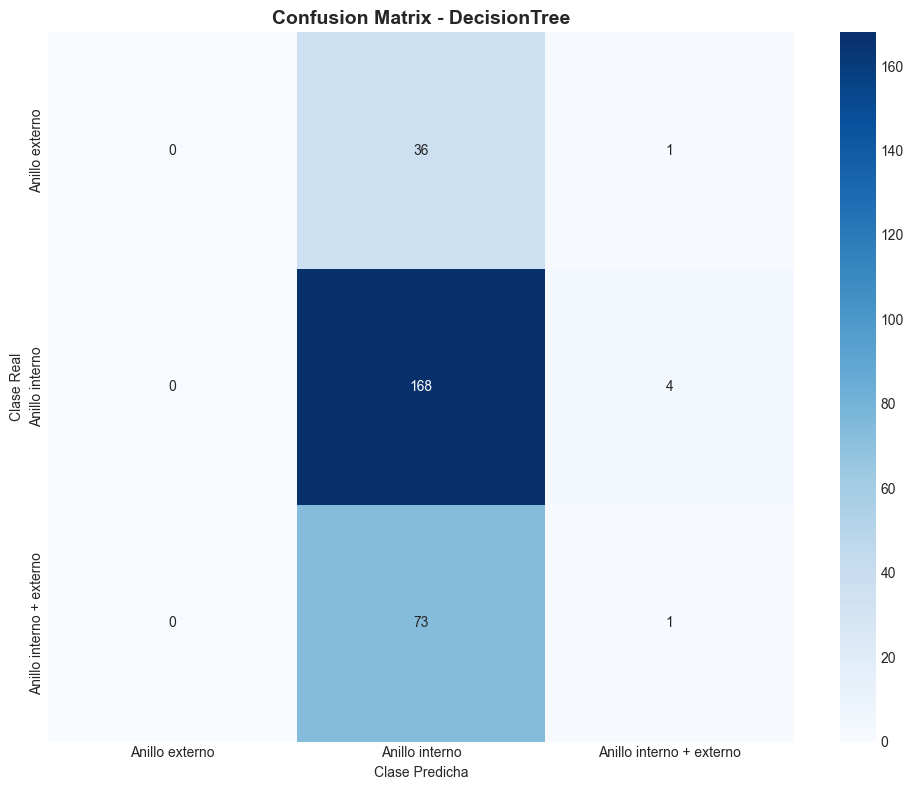


ANÁLISIS DE CONFUSION MATRIX

Diagonal principal = clasificaciones correctas
Fuera de la diagonal = errores (confusiones entre clases)

Principal confusión:
   Clase Anillo interno + externo confundida con Anillo interno
   (98.6% de las veces)


In [45]:
# Usar el mejor modelo (DecisionTree)
best_clf = dt_clf
best_pred = y_pred_dt

# Confusion Matrix
cm = confusion_matrix(y_test, best_pred)

# Visualización mejorada
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=sorted(y.unique()),
            yticklabels=sorted(y.unique()))
plt.title('Confusion Matrix - DecisionTree', fontsize=14, fontweight='bold')
plt.ylabel('Clase Real')
plt.xlabel('Clase Predicha')
plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("ANÁLISIS DE CONFUSION MATRIX")
print("="*80)
print("\nDiagonal principal = clasificaciones correctas")
print("Fuera de la diagonal = errores (confusiones entre clases)")

# Identificar confusiones principales
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
np.fill_diagonal(cm_norm, 0)  # Ignorar diagonal

max_confusion_idx = np.unravel_index(cm_norm.argmax(), cm_norm.shape)
classes = sorted(y.unique())

print(f"\nPrincipal confusión:")
print(f"   Clase {classes[max_confusion_idx[0]]} confundida con {classes[max_confusion_idx[1]]}")
print(f"   ({cm_norm[max_confusion_idx]*100:.1f}% de las veces)")

### 7.2 Classification Report

In [46]:
print("\n" + "="*80)
print("CLASSIFICATION REPORT - RANDOM FOREST")
print("="*80)
print(classification_report(y_test, best_pred, 
                           target_names=[f"Clase {c}" for c in sorted(y.unique())]))


CLASSIFICATION REPORT - RANDOM FOREST
                                precision    recall  f1-score   support

          Clase Anillo externo       0.00      0.00      0.00        37
          Clase Anillo interno       0.61      0.98      0.75       172
Clase Anillo interno + externo       0.17      0.01      0.03        74

                      accuracy                           0.60       283
                     macro avg       0.26      0.33      0.26       283
                  weighted avg       0.41      0.60      0.46       283



### 7.3 Feature Importance

FEATURE IMPORTANCE ANALYSIS

Top 10 Features Más Importantes:


,feature,importance
0,ra,0.410257
2,z,0.366538
1,dec,0.223205


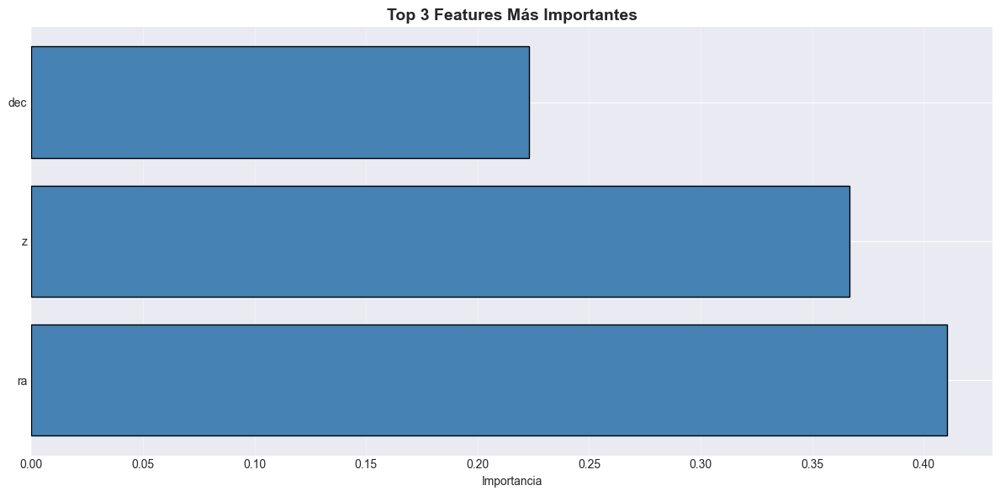


INTERPRETACIÓN:
Las 3 features más importantes son:
   1. ra: 0.4103
   3. z: 0.3665
   2. dec: 0.2232

Features con importancia < 0.01: 0


In [47]:
print("="*80)
print("FEATURE IMPORTANCE ANALYSIS")
print("="*80)

# Feature importance de Random Forest
feature_importance = pd.DataFrame({
    'feature': feature_cols,
    'importance': best_clf.feature_importances_
}).sort_values('importance', ascending=False)

print("\nTop 10 Features Más Importantes:")
display(feature_importance.head(10))

# Visualización
plt.figure(figsize=(12, 6))
top_n = min(15, len(feature_importance))
top_features = feature_importance.head(top_n)

plt.barh(range(top_n), top_features['importance'], color='steelblue', edgecolor='black')
plt.yticks(range(top_n), top_features['feature'])
plt.xlabel('Importancia')
plt.title(f'Top {top_n} Features Más Importantes', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')
plt.tight_layout()
plt.show()

# Análisis
print("\nINTERPRETACIÓN:")
print(f"Las 3 features más importantes son:")
for i, row in feature_importance.head(3).iterrows():
    print(f"   {i+1}. {row['feature']}: {row['importance']:.4f}")

# Features irrelevantes
threshold = 0.01
irrelevant = feature_importance[feature_importance['importance'] < threshold]
print(f"\nFeatures con importancia < {threshold}: {len(irrelevant)}")
if len(irrelevant) > 0:
    print(f"Considerar removerlas en iteraciones futuras:")
    for feat in irrelevant['feature'].head(5):
        print(f"   • {feat}")

## 8. Cross-Validation

CROSS-VALIDATION (5-FOLD ESTRATIFICADO)

F1-Score (macro) por fold:
   Fold 1: 0.3042
   Fold 2: 0.2470
   Fold 3: 0.2524
   Fold 4: 0.2874
   Fold 5: 0.2479

Estadísticas:
   Media:  0.2678
   Std:    0.0236
   Min:    0.2470
   Max:    0.3042


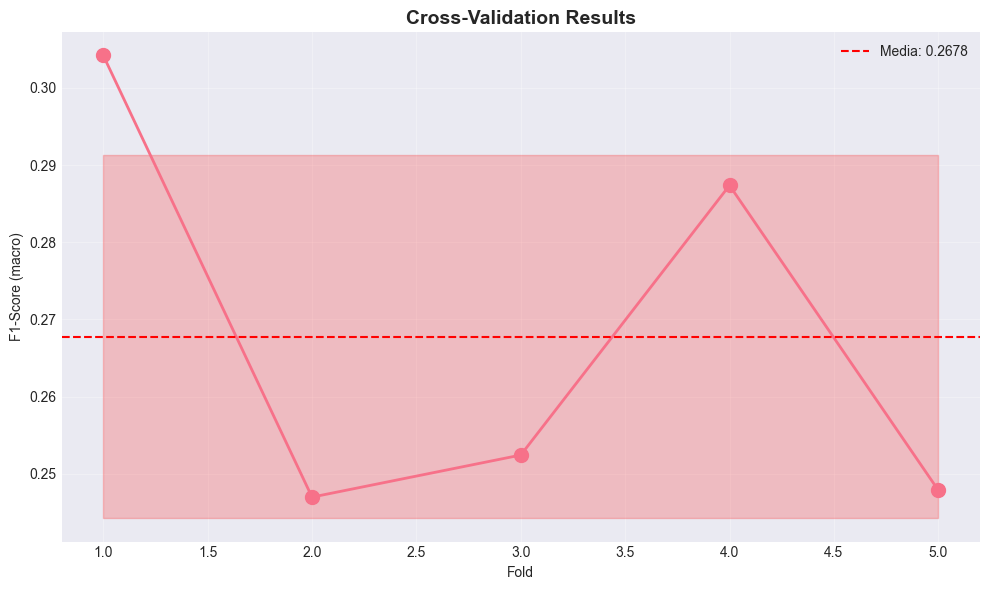


INTERPRETACIÓN:
 Modelo consistente - baja varianza entre folds


In [48]:
print("="*80)
print("CROSS-VALIDATION (5-FOLD ESTRATIFICADO)")
print("="*80)

# K-Fold estratificado
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

# Cross-validation scores
cv_scores = cross_val_score(best_clf, X_train, y_train, cv=cv, 
                            scoring='f1_macro', n_jobs=-1)

print(f"\nF1-Score (macro) por fold:")
for i, score in enumerate(cv_scores, 1):
    print(f"   Fold {i}: {score:.4f}")

print(f"\nEstadísticas:")
print(f"   Media:  {cv_scores.mean():.4f}")
print(f"   Std:    {cv_scores.std():.4f}")
print(f"   Min:    {cv_scores.min():.4f}")
print(f"   Max:    {cv_scores.max():.4f}")

# Visualización
plt.figure(figsize=(10, 6))
plt.plot(range(1, 6), cv_scores, 'o-', linewidth=2, markersize=10)
plt.axhline(cv_scores.mean(), color='red', linestyle='--', 
            label=f'Media: {cv_scores.mean():.4f}')
plt.fill_between(range(1, 6), 
                 cv_scores.mean() - cv_scores.std(),
                 cv_scores.mean() + cv_scores.std(),
                 alpha=0.2, color='red')
plt.xlabel('Fold')
plt.ylabel('F1-Score (macro)')
plt.title('Cross-Validation Results', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\nINTERPRETACIÓN:")
if cv_scores.std() < 0.05:
    print(" Modelo consistente - baja varianza entre folds")
elif cv_scores.std() < 0.10:
    print("Varianza moderada - modelo relativamente estable")
else:
    print("Alta varianza - modelo inestable, revisar datos o modelo")

## 9. Análisis de Errores

In [49]:
print("="*80)
print("ANÁLISIS DE ERRORES")
print("="*80)

# Crear dataframe con predicciones
X_test_with_pred = X_test.copy()
X_test_with_pred['true_label'] = y_test.values
X_test_with_pred['predicted_label'] = best_pred
X_test_with_pred['correct'] = X_test_with_pred['true_label'] == X_test_with_pred['predicted_label']

# Ejemplos incorrectos
errors = X_test_with_pred[~X_test_with_pred['correct']]

print(f"\nTotal de errores: {len(errors)} / {len(X_test)} ({100*len(errors)/len(X_test):.1f}%)")

# Análisis por tipo de error
error_types = errors.groupby(['true_label', 'predicted_label']).size().sort_values(ascending=False)

print(f"\nTipos de error más comunes:")
for (true, pred), count in error_types.head(5).items():
    print(f"   Clase {true} predicha como {pred}: {count} veces")

# Mostrar ejemplos de errores
if len(errors) > 0:
    print(f"\nEjemplos de clasificaciones incorrectas:")
    display(errors[['true_label', 'predicted_label'] + feature_cols[:3]].head(10))

ANÁLISIS DE ERRORES

Total de errores: 114 / 283 (40.3%)

Tipos de error más comunes:
   Clase Anillo interno + externo predicha como Anillo interno: 73 veces
   Clase Anillo externo predicha como Anillo interno: 36 veces
   Clase Anillo interno predicha como Anillo interno + externo: 4 veces
   Clase Anillo externo predicha como Anillo interno + externo: 1 veces

Ejemplos de clasificaciones incorrectas:


,true_label,predicted_label,ra,dec,z
1404,Anillo externo,Anillo interno,347.92525,15.110629,0.040027
100,Anillo interno + externo,Anillo interno,116.79501,50.359043,0.037858
644,Anillo interno + externo,Anillo interno,171.65725,51.573064,0.026416
510,Anillo interno + externo,Anillo interno,161.37681,17.619639,0.042032
814,Anillo interno + externo,Anillo interno,186.37182,47.273180,0.024868
928,Anillo externo,Anillo interno,201.10594,30.959287,0.048476
1253,Anillo interno + externo,Anillo interno,242.19978,8.950172,0.047958
1187,Anillo interno + externo,Anillo interno,232.04916,2.530071,0.038331
1147,Anillo interno + externo,Anillo interno,226.36639,14.427967,0.045189
744,Anillo externo,Anillo interno,179.47273,41.937156,0.048261


## 10. Conclusiones del Baseline

In [50]:
print("="*80)
print("CONCLUSIONES DEL ANÁLISIS BASELINE")
print("="*80)

print("""
### RESPUESTAS A LAS PREGUNTAS CLAVE:

1️.**¿Qué algoritmo se puede utilizar como baseline?**
""")

print(f"RECOMENDADO: Decision Tree")
print(f"      - Test Accuracy: {metrics_dt['test_accuracy']:.4f}")
print(f"      - F1-Score: {metrics_dt['test_f1_macro']:.4f}")
print(f"      - Kappa: {metrics_dt['test_kappa']:.4f}")

print("""2️.**¿Se puede determinar la importancia de las características?**
""")
print(f"SÍ - Las 3 features más importantes son:")
for i, row in feature_importance.head(3).iterrows():
    print(f"      {i+1}. {row['feature']}: {row['importance']:.4f}")

threshold = 0.01
irrelevant_count = len(feature_importance[feature_importance['importance'] < threshold])
print(f"\nFeatures con baja importancia (<{threshold}): {irrelevant_count}")
print(f"Considerar removerlas en iteraciones futuras.")

print("""3.**¿El modelo está sub/sobreajustando?**
""")
gap = metrics_dt['overfitting_gap']
if gap < 0.05:
    print(f"NO hay overfitting (gap={gap:.4f})")
elif gap < 0.15:
    print(f"Overfitting MODERADO (gap={gap:.4f})")
else:
    print(f"Overfitting ALTO (gap={gap:.4f})")

print("""4.**¿Cuál es la métrica adecuada para este problema?**
   PRIMARIA: F1-Score (macro) - maneja bien el desbalanceo
   SECUNDARIAS: 
      - Accuracy (general)
      - Cohen's Kappa (ajustado por azar)
      - Precision/Recall por clase (análisis detallado)
""")   

print(""" 5.**¿Cuál debería ser el desempeño mínimo?**
""")
n_classes = len(y.unique())
random_acc = 1.0 / n_classes
achieved_acc = metrics_rf['test_accuracy']

print(f"   Random guess: {random_acc:.4f} ({100*random_acc:.1f}%)")
print(f"   Baseline RF:  {achieved_acc:.4f} ({100*achieved_acc:.1f}%)")
print(f"   Mejora: {100*(achieved_acc-random_acc)/random_acc:.1f}% sobre azar")

if achieved_acc > random_acc * 1.5:
    print(f"\n   El modelo ES VIABLE - supera significativamente al azar")
else:
    print(f"\n   El modelo apenas supera al azar - problema difícil")

print("\n" + "="*80)
print(" DESEMPEÑO MÍNIMO ESTABLECIDO PARA MODELOS FUTUROS:")
print("="*80)
print(f"   F1-Score (macro) > {metrics_rf['test_f1_macro']:.4f}")
print(f"   Accuracy > {metrics_rf['test_accuracy']:.4f}")
print(f"   Kappa > {metrics_rf['test_kappa']:.4f}")

print("\n PRÓXIMOS PASOS:")
print("   1. Implementar CNN para aprovechar características de imagen")
print("   2. Feature engineering adicional basado en importancias")
print("   3. Técnicas de balanceo de clases (SMOTE, class weights)")
print(f"   4. Remover features irrelevantes (importancia < {threshold})")
print("   5. Hyperparameter tuning del Random Forest")
print("   6. Ensemble con CNN + features tabulares")

CONCLUSIONES DEL ANÁLISIS BASELINE

### RESPUESTAS A LAS PREGUNTAS CLAVE:

1️.**¿Qué algoritmo se puede utilizar como baseline?**

RECOMENDADO: Decision Tree
      - Test Accuracy: 0.5972
      - F1-Score: 0.2578
      - Kappa: -0.0082
2️.**¿Se puede determinar la importancia de las características?**

SÍ - Las 3 features más importantes son:
      1. ra: 0.4103
      3. z: 0.3665
      2. dec: 0.2232

Features con baja importancia (<0.01): 0
Considerar removerlas en iteraciones futuras.
3.**¿El modelo está sub/sobreajustando?**

NO hay overfitting (gap=0.0345)
4.**¿Cuál es la métrica adecuada para este problema?**
   PRIMARIA: F1-Score (macro) - maneja bien el desbalanceo
   SECUNDARIAS: 
      - Accuracy (general)
      - Cohen's Kappa (ajustado por azar)
      - Precision/Recall por clase (análisis detallado)

 5.**¿Cuál debería ser el desempeño mínimo?**

   Random guess: 0.3333 (33.3%)
   Baseline RF:  0.6042 (60.4%)
   Mejora: 81.3% sobre azar

   El modelo ES VIABLE - supera sig

Resumen de la metodología CRISP-ML(Q):

Visengeriyeva, L., Kammer, A., Bär, I., Kniesz, A., y Plöd, M. (2023). CRISP-ML(Q). The ML Lifecycle Process. MLOps. INNOQ. https://ml-ops.org/content/crisp-mlEnlaces a un sitio externo.

Licencia: Publicado bajo licencia Creative Commons Attribution 4.0 International Public LicenseEnlaces a un sitio externo..
Accesibilidad: En el sitio, se puede ajustar el tamaño del texto con la herramienta de zoom del navegador web.
 

Las secciones requeridas, en función del algoritmo a aplicar, del libro de consulta:

Géron, A. (2022). Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (3rd ed.). O´Reilly Media. https://learning.oreilly.com/library/view/hands-on-machine-learning/9781098125967/.

Licencia: Copyright © 2023 Aurélien Géron. All rights reserved. Permisos del editor: Se permite copiar / pegar.
Accesibilidad: En la página de la obra dentro de la base de datos, se puede ajustar el tamaño de la letra, el color de fondo y el ancho del párrafo. Para mayor información, se puede consultar la página Accessibility GuideLinks to an external site., de O’Reilly (en inglés).